# Desafío Spike 01/08/2021
Matheus Pinto Arratia

En este desafío vamos a ver si somos capaces de predecir el precio de un insumo básico, como la leche, a partir de variables climatológicas y macroeconómicas. No siempre estos datos nos entregan toda la información que nos gustaría, como por ejemplo señales claras del avance de la sequía a lo largo del país, sin embargo, nos permite entender otro tipo de efectos, como movimientos en ciertos sectores de la economía. En esta línea, te iremos guiando para construir un análisis y algunos modelos que nos ayuden a concluir.

Versión de python utilizada: 3.8.0

Después de clonar el repositorio, dejo el archivo requirements.txt con las versiones de las librerías utilizadas, ejectutar el comando acá debajo

In [1]:
# ! pip install -r requirements.txt

In [2]:
import os
os.chdir(r"C:\Users\mateu\Desktop\portafolio\challenge")
print(os.listdir())

['.git', '.gitignore', '.ipynb_checkpoints', 'codes', 'data', 'images', 'main.ipynb', 'main_jupyter.py', 'README.md', 'requirements.txt', 'results', 'src']


In [3]:
%matplotlib inline
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
from datetime import datetime
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('dark_background')

# 1. Datos Precipitaciones e Indicadores Económicos Banco Central

En esta sección haré el análisis exploratorio de los datos, por favor antes de empezar, setee el path de la carpeta como variable de ambiente, para poder ocupar las librerías construidas para este trabajo.

In [4]:
# paths
path_bc = "data/raw/banco_central.csv"
path_pr = "data/raw/precipitaciones.csv"

In [5]:
# cargar los datos
df_pr = pd.read_csv(path_pr)
df_bank = pd.read_csv(path_bc)

# 2. Análisis de datos. Creación de variables

## 2.1 Realiza un análisis exploratorio de la base de datos
¿Qué puedes decir de los datos, sus distribuciones, valores faltantes, otros? ¿Hay algo que te llame la atención?

Función para hacer una exploración de los datos en bruto, a través de la librería pandas profilling

In [6]:
from pandas_profiling import ProfileReport


def profiling_report(path_csv, minimal_mode=False, dark_mode=True,
                     filename="data"):
    """
    Utiliza la libreria pandas_profiling para hacer una exploración visual
    rápida de los datos, los cuales guarda en un formato .html

    Parameters
    ----------
    path_csv : string
        path al .csv que contiene la data.
    minimal_mode : string, optional
        En el caso de que sea True, hace cálculo de correlaciones no lineales.
        The default is False.
    dark_mode : string, optional
        si es en el modo oscuro o no. The default is True.
    filename : string, optional
        Nombre del archivo a analizar. The default is "data".

    Returns
    -------
    Archivo .html con un análisis exploratorio rápido de los datos.

    """
    # lectura del .csv
    df = pd.read_csv(path_csv)
    name = filename.replace("_", " ").title()

    title = f"Análisis Eploratorio de Data: Spike {name}"
    prof = ProfileReport(df,
                         title=title,
                         explorative=False,
                         minimal=minimal_mode,
                         dark_mode=dark_mode)
    # guardar el html
    path_output = f'results/eda_{filename}.html'
    prof.to_file(output_file=path_output)

Los resultados de estos análisis exploratorios se encontraran en dos archivos .html en la carpeta ./results/ del repositorio, estos análisis exploratorios son super completos y nos ayudan a entender de manera visual el dataset con el que estamos trabajando, se realizan profiling reports tanto para el dataset de precipitaciones, como el de indicadores ecónomicos.

Acá, solo comentaré lo que me llamó más la atención de la exploración rápida.

In [7]:
# Análisis Exploratorio Banco Central ver link: 
# profiling_report(path_bc, minimal_mode=False, dark_mode=True, filename="banco_central")

In [8]:
# Análisis Exploratorio Precipitaciones ver link: 
# profiling_report(path_pr, minimal_mode=False, dark_mode=True, filename="precipitaciones")

### 2.1.1 Dataset Precipitaciones (Exploración)

In [9]:
df_pr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 496 entries, 0 to 495
Data columns (total 9 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   date                                 496 non-null    object 
 1   Coquimbo                             496 non-null    float64
 2   Valparaiso                           496 non-null    float64
 3   Metropolitana_de_Santiago            496 non-null    float64
 4   Libertador_Gral__Bernardo_O_Higgins  496 non-null    float64
 5   Maule                                496 non-null    float64
 6   Biobio                               496 non-null    float64
 7   La_Araucania                         496 non-null    float64
 8   Los_Rios                             496 non-null    float64
dtypes: float64(8), object(1)
memory usage: 35.0+ KB


In [10]:
df_pr.sort_values(by=["date"], ascending=True, inplace=True)
df_pr.reset_index(drop=True, inplace=True)
df_pr.head(10)

,date,Coquimbo,Valparaiso,Metropolitana_de_Santiago,Libertador_Gral__Bernardo_O_Higgins,Maule,Biobio,La_Araucania,Los_Rios
0,1979-01-01,2.641948,0.587062,2.447114,1.608992,3.736215,17.859634,25.212940,45.596447
1,1979-02-01,1.179804,2.432192,3.997852,4.346310,16.347637,17.680612,18.085072,34.075039
2,1979-03-01,0.255490,0.020601,0.000000,0.055488,0.545324,14.435698,28.696504,66.232248
3,1979-04-01,10.173699,11.745779,13.722349,12.989194,21.880607,39.136483,43.617921,73.548127
4,1979-05-01,1.039098,18.609286,50.187148,104.451550,143.914334,219.729235,279.409718,438.005116
5,1979-06-01,0.141157,0.000000,1.397164,7.378558,28.797945,72.501902,113.488705,179.949832
6,1979-07-01,34.630791,118.340422,170.614262,301.256558,482.199009,411.270877,356.070480,424.988334
7,1979-08-01,9.073373,49.270309,130.503624,200.210387,294.567554,378.102706,458.753077,645.763592
8,1979-09-01,12.041765,33.970292,77.705101,156.477457,161.299858,158.965598,203.191759,252.733618
9,1979-10-01,0.018634,0.558101,10.871275,14.557008,11.238902,51.010499,121.420487,177.008294


In [11]:
# Convertir columna fecha a timestamps
date_format = "%Y-%m-%d"
df_pr["date"] = df_pr["date"].apply(lambda x: datetime.strptime(x, date_format))

In [12]:
# Fechas comprendidas en los datos
print("Fecha inicial:", df_pr["date"].min())
print("Fecha final:", df_pr["date"].max())
print("Cantidad de días del periodo:", (df_pr["date"].max() - df_pr["date"].min()).days)

Fecha inicial: 1979-01-01 00:00:00
Fecha final: 2020-04-01 00:00:00
Cantidad de días del periodo: 15066


In [13]:
months_quantity = (2020 - 1979) * 12 + 4
print("Cantidad de meses que debiese haber:", months_quantity)

Cantidad de meses que debiese haber: 496


In [14]:
df_pr.describe(include='all')

,date,Coquimbo,Valparaiso,Metropolitana_de_Santiago,Libertador_Gral__Bernardo_O_Higgins,Maule,Biobio,La_Araucania,Los_Rios
count,496,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000
unique,496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,1979-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,1979-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2020-04-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,16.154691,32.450980,49.666682,72.249805,98.662773,128.113406,151.486456,199.451789
std,NaN,32.629286,55.434330,74.361099,101.426112,122.766771,130.056094,126.628503,140.073615
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.001170,0.005331,0.748127
25%,NaN,0.821521,1.538162,5.297546,5.343992,11.897363,29.356684,52.930343,89.805643


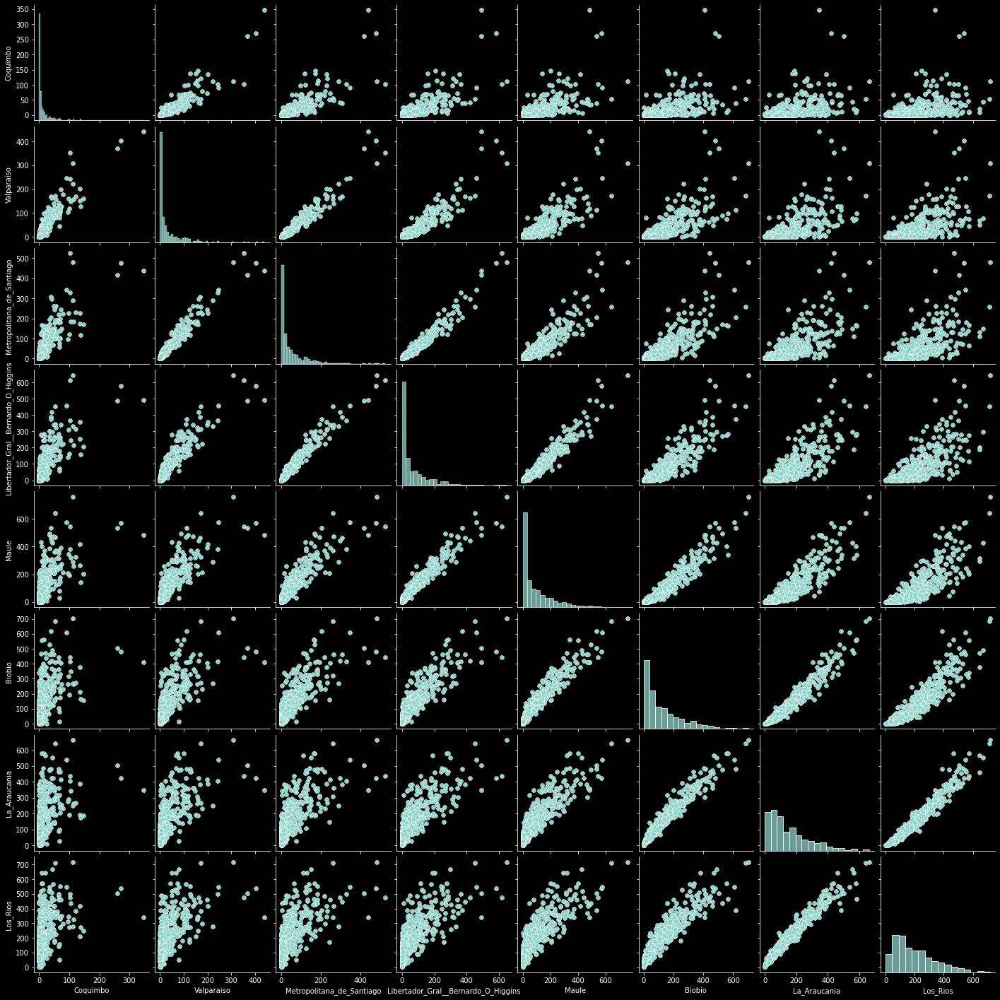

In [15]:
sns.pairplot(df_pr)

### 2.1.2 Dataset Precipitaciones (Comentarios)

Del dataset en general, 9 features, 8 de las cuales son númericas y 1 categorica (fecha), 496 observaciones, no contiene duplicados y tampoco valores faltantes en el espacio de datos entregados (496 meses)

A simple vista se nota bastante correlación lineal a través de los pairplots visibles entre variables del dataset de precipitaciones y como se mencionaba anteriormente las distribuciones están sesgadas a la izquierda (guardar esta info para cuando se creen más variables, log fetures podrían hacer más normales las distribuciones).

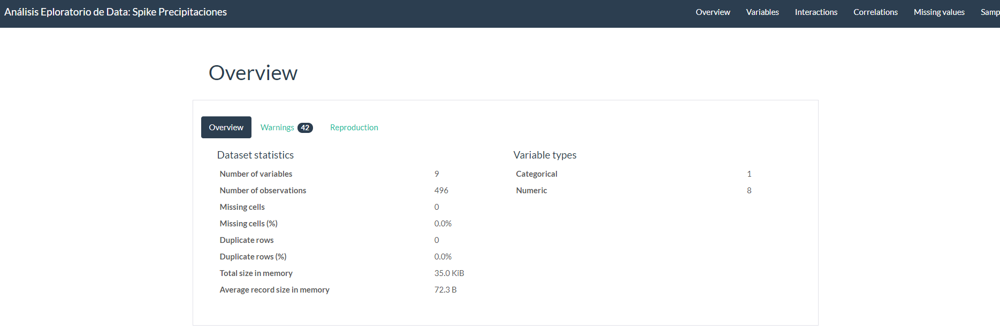

La cantidad de registros de fechas es 496 los que contienen una cantidad de dias en el rango de 15066. Desde el 1 de Enero de 1979 hasta el 1 de abril de 2020. Los datos pertencen a las precipitaciones mensuales por región. Hay un registro para todos los días 1 del mes.

**Columna fecha**

La información a nivel de la columna fecha esta completa, tal y como se muestran unas celdas más arriba

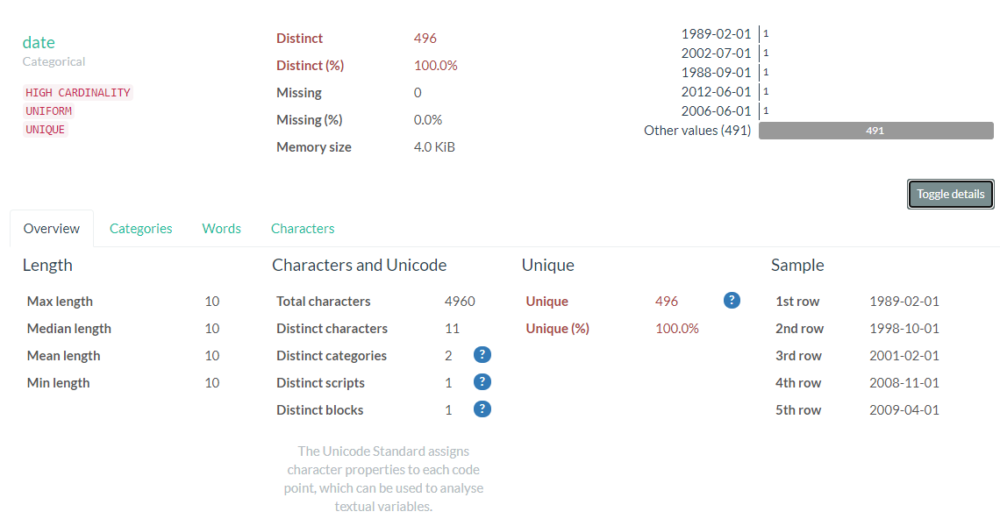

**Columnas de precipitación [todas las regiones]** 

Las columnas de precipitaciones, tienen distribuciones sesgadas a la izquierda, lo que es logico dentro de un clima mediterraneo, donde la mayor parte del año no hay demasiadas precipitaciones, su variabilidad esta sujeta a la región que analizamos, las regiones más al sur son las que acumulan más precipitaciones

Como muestra el profilling y el pairplot realizado más arriba

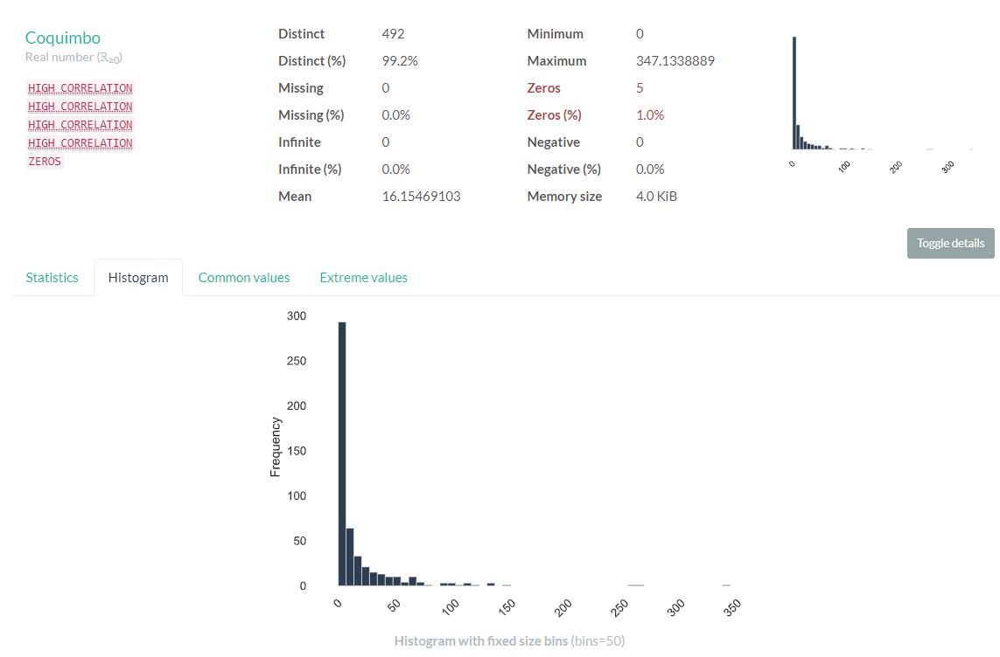


A simple vista se nota bastante correlación lineal entre regiones, a través de los pairplots visibles entre variables del dataset de precipitaciones y como se mencionaba anteriormente las distribuciones están sesgadas a la izquierda (# borrar después, pero guardar esta info para cuando se creen más features, log fetures podrían hacer más normales las distribuciones).

La cantidad de registros de fechas es 496 los que contienen una cantidad de dias en el rango de 15066. Desde el 1 de Enero de 1979 hasta el 1 de abril de 2020. Los datos pertencen a las precipitaciones mensuales por región. Hay un registro para todos los días 1 del mes. No tengo valores faltantes duplicados, ni valores faltantes para estas fechas, como lo muestran las siguientes lineas de código

In [16]:
df_pr.drop_duplicates(subset=["date"], inplace=True)
df_pr.reset_index(drop=True, inplace=True)
print(df_pr.shape)

(496, 9)


In [17]:
df_pr.isna().sum()

date                                   0
Coquimbo                               0
Valparaiso                             0
Metropolitana_de_Santiago              0
Libertador_Gral__Bernardo_O_Higgins    0
Maule                                  0
Biobio                                 0
La_Araucania                           0
Los_Rios                               0
dtype: int64

### 2.1.3 Dataset Banco Central (Exploración)

In [18]:
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 85 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   Periodo                                                                             614 non-null    object 
 1   Imacec_empalmado                                                                    300 non-null    object 
 2   Imacec_produccion_de_bienes                                                         300 non-null    object 
 3   Imacec_minero                                                                       300 non-null    object 
 4   Imacec_industria                                                                    301 non-null    object 
 5   Imacec_resto_de_bienes                                                              300 non-null   

In [19]:
df_bank.describe(include="all")

,Periodo,Imacec_empalmado,Imacec_produccion_de_bienes,Imacec_minero,Imacec_industria,Imacec_resto_de_bienes,Imacec_comercio,Imacec_servicios,Imacec_a_costo_de_factores,Imacec_no_minero,...,Indice_de_tipo_de_cambio_real___TCR_promedio_1986_100,Indice_de_produccion_industrial,Indice_de_produccion_industrial__mineria,Indice_de_produccion_industrial_electricidad__gas_y_agua,Indice_de_produccion_industrial__manufacturera,Generacion_de_energia_electrica_CDEC_GWh,Indice_de_ventas_comercio_real_IVCM,Indice_de_ventas_comercio_real_no_durables_IVCM,Indice_de_ventas_comercio_real_durables_IVCM,Ventas_autos_nuevos
count,614,300,300,300,301,300,301,300,300,300,...,420,144,372,84,360,264,84,84,85,145.000000
unique,612,298,298,298,299,298,299,298,298,298,...,418,142,355,82,340,262,82,82,83,NaN
top,2019-08-01 00:00:00 UTC,113.886.371,103.237.519,106.828.407,105.153.122,984.395.274,106.901.816,122.596.004,113.695.907,114.580.893,...,948.715.254,104.034.103,337.440.681,107.666.732,68.979.954,654.060.172,116.203.109,107.385.297,15.342.321,NaN
freq,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,3,2,2,2,2,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26694.082759
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7170.231956
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4658.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23701.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27912.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31800.000000


Formateo de fecha para visualizar mejor

In [20]:
# pasar fechas a timestamps
date_format = "%Y-%m-%d"
df_bank = df_bank[df_bank["Periodo"] != "2020-13-01 00:00:00 UTC"]
df_bank["Periodo"] = df_bank["Periodo"].apply(lambda x: datetime.strptime(str(x[0:10]), date_format))

In [21]:
df_bank.sort_values(by=["Periodo"], ascending=True, inplace=True)
df_bank.reset_index(drop=True, inplace=True)
list(df_bank.columns)

['Periodo',
 'Imacec_empalmado',
 'Imacec_produccion_de_bienes',
 'Imacec_minero',
 'Imacec_industria',
 'Imacec_resto_de_bienes',
 'Imacec_comercio',
 'Imacec_servicios',
 'Imacec_a_costo_de_factores',
 'Imacec_no_minero',
 'PIB_Agropecuario_silvicola',
 'PIB_Pesca',
 'PIB_Mineria',
 'PIB_Mineria_del_cobre',
 'PIB_Otras_actividades_mineras',
 'PIB_Industria_Manufacturera',
 'PIB_Alimentos',
 'PIB_Bebidas_y_tabaco',
 'PIB_Textil',
 'PIB_Maderas_y_muebles',
 'PIB_Celulosa',
 'PIB_Refinacion_de_petroleo',
 'PIB_Quimica',
 'PIB_Minerales_no_metalicos_y_metalica_basica',
 'PIB_Productos_metalicos',
 'PIB_Electricidad',
 'PIB_Construccion',
 'PIB_Comercio',
 'PIB_Restaurantes_y_hoteles',
 'PIB_Transporte',
 'PIB_Comunicaciones',
 'PIB_Servicios_financieros',
 'PIB_Servicios_empresariales',
 'PIB_Servicios_de_vivienda',
 'PIB_Servicios_personales',
 'PIB_Administracion_publica',
 'PIB_a_costo_de_factores',
 'Impuesto_al_valor_agregado',
 'Derechos_de_Importacion',
 'PIB',
 'Precio_de_la_gaso

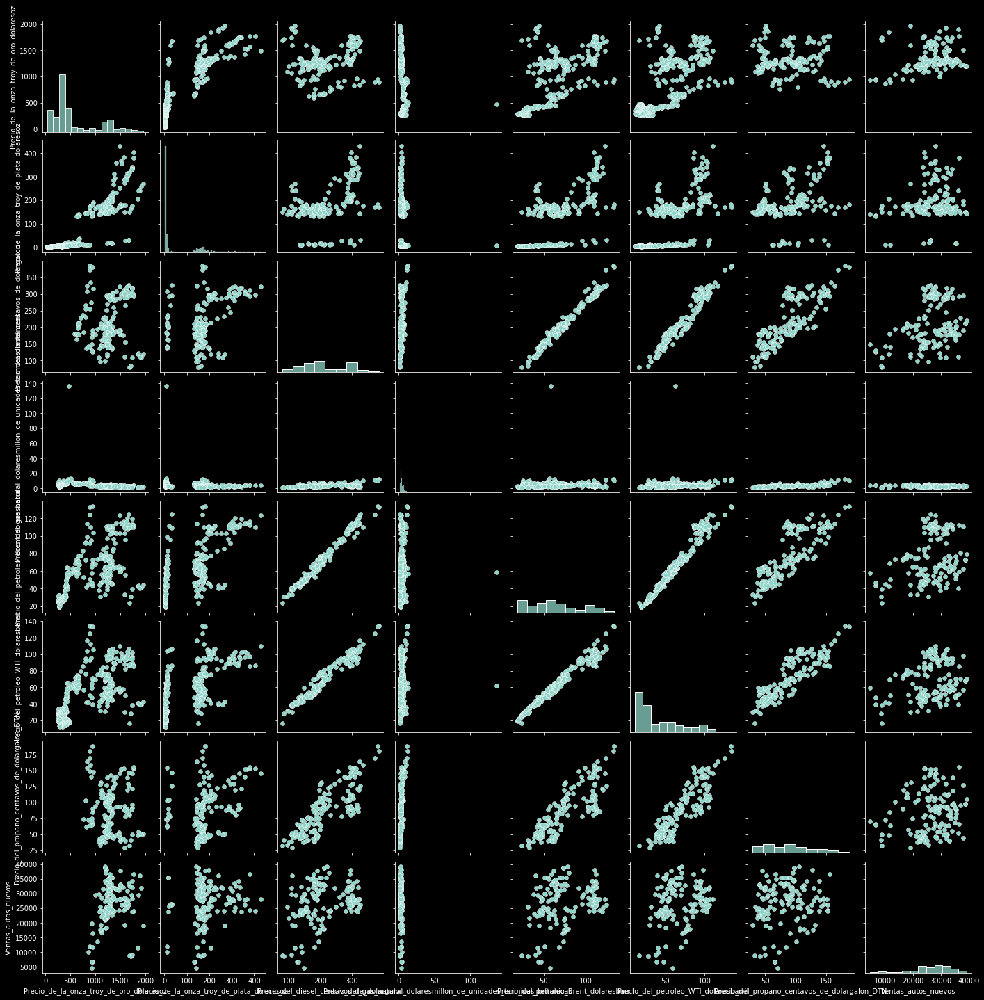

In [22]:

# Solo es posible visualizar un pairplot en las columnas actualmente númericas, ver sección de comentarios para hacer a posterior la limpieza de estas columans/
sns.pairplot(df_bank)

### 2.2.4 Dataset Banco Central (Comentarios)

De los análisis exploratorios que se hicieron con pandas-profiling su pudieron encontrar fallas en el tipo de dato de las columnas con valores númericos, dado que contienen multiples puntuaciones, lo cual es un punto a considerar en el proceso de limpieza, además la presencia de caracteres "a" dentro de varias columnas del dataset, se corrigé elimina una fila con una mala formatación de fecha y multiples features nans.


Las columnas presentes en el dataset, es la información siguiente:


Imacec el Índice Mensual de Actividad Económica (Imacec) es una estimación que resume la actividad de los distintos sectores de la economía en un determinado mes, a precios del año anterior; su variación interanual constituye una aproximación de la evolución del PIB. -- > orden de magnitud de **10^2**

PIB: Producto interno bruto

IVA: Impuesto ventas y servicios

Precio de diversas materias primas

Derechos de importación 

Tasa de ocupación en diferentes sectores

TCM: El tipo de cambio multilateral (TCM) mide el valor nominal del peso chileno con respecto a una 
canasta amplia de monedas extranjeras.

TCR: El tipo de cambio real de una divisa respecto a otra es el poder de compra de una divisa tras su conversión

Indice de producción industrial

Generación de energía eléctricas

IVC

Venta autos nuevos

Precio dolar observado


Las columnas disponibles tienen una notación especifica, para hacer este proceso de limpieza, buscaré ordenes de magnitud de las distintas variables a continuación, con el fin de determinar el factor divisor de cada una de las columnas (considerando un equiespaciado de puntos de largo 3)

## 2.2 Realiza una limpieza de datos para que las series de tiempo no tengan duplicados ni valores incorrectos.


Tal y como se mencionó en la sección anterior, el dataset con mayores problemas es el dataset del banco central, sobre el cual dedicaremos más tiempo en esta etapa de cleaning.

A simple vista la presencia de valores faltantes puede ser notoria, ocuparé dos funciones que habitualmente ocupo para localizar puntos vacíos en los dataframes y estar seguro que estoy identificando todos los nans


#### 2.2.1 Eliminar espacios en los datos (Banco Central)

Con el fin de asegurarme que no hay espacios en blancos el los inicios de cada serie (debido a la formatación de más abajo)

In [23]:
def drop_spaces_data(df):
    """
    Sacar los espacios de columnas que podrián venir interferidas

    Parameters
    ----------
    df : pandas.dataframe
        Input data
    column : string
        String sin espacios en sus columnas

    Returns
    -------
        Sacar espacios en los inicios y fines de las columnas categoricas

    """
    for column in df.columns:
        try:
            df[column] = df[column].str.lstrip()
            df[column] = df[column].str.rstrip()
        except Exception as e:
            print(e)
            pass
    return df

In [24]:
# correr stack de limpieza previa para asegurar buena formatación de los datos
# en el caso de que hayan vacios en los comienzos de columnas categoricas
df_bank = drop_spaces_data(df_bank)

Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!
Can only use .str accessor with string values!


#### 2.2.2 Eliminar valores incorrectos y marcarlos como np.nan (Banco Central)

In [25]:
def make_empty_identifiable(value):
    """
    Hacer identificables los vacios, dado que pueden venir con el valor "a",
    o hacer identificables como nans valores como string == "".

    Parameters
    ----------
    value : int, string, etc
        Valor con el que se trabaja.

    Returns
    -------
        Imputa np.nan en valores incorrectos.

    """
    # valores a dentro del dataset
    if value == "a":
        value = np.nan
    # en el caso que hayan string vacios
    elif value == "":
        value = np.nan
    return value


def replace_empty_nans(df):
    """
    Hace identificable los vacios con nans, para en el momento de tratarlos
    agarrarlos todos.

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe con el que se esta trabajando.

    Returns
    -------
        Colocar nans en los vacios.

    """
    for col in df.columns:
        print("Reemplazando 'a' y '':", col, "...")
        df[col] = df[col].apply(lambda x: make_empty_identifiable(x))
    return df




In [26]:
# reemplaza vacios con nans, para identificar vacios en el dataframe
df_bank = replace_empty_nans(df_bank)

Reemplazando 'a' y '': Periodo ...
Reemplazando 'a' y '': Imacec_empalmado ...
Reemplazando 'a' y '': Imacec_produccion_de_bienes ...
Reemplazando 'a' y '': Imacec_minero ...
Reemplazando 'a' y '': Imacec_industria ...
Reemplazando 'a' y '': Imacec_resto_de_bienes ...
Reemplazando 'a' y '': Imacec_comercio ...
Reemplazando 'a' y '': Imacec_servicios ...
Reemplazando 'a' y '': Imacec_a_costo_de_factores ...
Reemplazando 'a' y '': Imacec_no_minero ...
Reemplazando 'a' y '': PIB_Agropecuario_silvicola ...
Reemplazando 'a' y '': PIB_Pesca ...
Reemplazando 'a' y '': PIB_Mineria ...
Reemplazando 'a' y '': PIB_Mineria_del_cobre ...
Reemplazando 'a' y '': PIB_Otras_actividades_mineras ...
Reemplazando 'a' y '': PIB_Industria_Manufacturera ...
Reemplazando 'a' y '': PIB_Alimentos ...
Reemplazando 'a' y '': PIB_Bebidas_y_tabaco ...
Reemplazando 'a' y '': PIB_Textil ...
Reemplazando 'a' y '': PIB_Maderas_y_muebles ...
Reemplazando 'a' y '': PIB_Celulosa ...
Reemplazando 'a' y '': PIB_Refinacion_d

#### 2.2.3 Eliminación de duplicados en las fechas (Banco Central)

In [27]:
df_bank['Periodo'].describe()

count                     613
unique                    611
top       2019-08-01 00:00:00
freq                        2
first     1970-01-01 00:00:00
last      2020-11-01 00:00:00
Name: Periodo, dtype: object

Se encuentran fechas duplicadas, por lo que se deben tratar

In [28]:
df_bank.drop_duplicates(subset=['Periodo'], inplace=True)
df_bank.sort_values(by=['Periodo'], ascending=True,inplace=True)
df_bank.reset_index(drop=True, inplace=True)
df_bank.head(3)

,Periodo,Imacec_empalmado,Imacec_produccion_de_bienes,Imacec_minero,Imacec_industria,Imacec_resto_de_bienes,Imacec_comercio,Imacec_servicios,Imacec_a_costo_de_factores,Imacec_no_minero,...,Indice_de_tipo_de_cambio_real___TCR_promedio_1986_100,Indice_de_produccion_industrial,Indice_de_produccion_industrial__mineria,Indice_de_produccion_industrial_electricidad__gas_y_agua,Indice_de_produccion_industrial__manufacturera,Generacion_de_energia_electrica_CDEC_GWh,Indice_de_ventas_comercio_real_IVCM,Indice_de_ventas_comercio_real_no_durables_IVCM,Indice_de_ventas_comercio_real_durables_IVCM,Ventas_autos_nuevos
0,1970-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1970-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1970-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 2.2.4 Tratamiento de valores en columnas númericas (Banco Central)

Como se comentó durante el análisis exploratorio, cada columna tiene una notación diferente, por lo cual no es tan simple como eliminar los primeros puntos, si no que los valores deben hacer sentido y comportarse dentro de un cierto rango, del cual pertencen. Por se buscaran ordenes de magnitud de cada uno de los features, con el proposito de encontrar un factor divisor o de aplificación que regule el valor del valor, dentro de los rangos permitidos en la columna.

Para ello he creado la función **values_treatement**, la cual se encarga de hacer el proceso de limpieza de estos datos. Esta llama a otras funciones que realizan el preprocesamiento de ciertos features en particular, como por ejemplo el IMACEC, PIB, PRECIOS y las otras columnas.

Se puede llegar a hardcodear los ordenes de magnitud de todas las columnas presentes en el dataset, pero, esto llevaría mucho tiempo por lo cual se generalizaron rangos, en los cuales se preprocesan los datos.

**Funciones de Utilidad en el tratamiento de los datos**

In [29]:
def reduction_factor(x):
    """
    Función para amplificar los valores del PIB en función del rango que están
    quedando, los valores del tratamiento, fueron altamente hardcodeados,
    lo reconozco.

    Parameters
    ----------
    x : float
        Valor del KPI.

    Returns
    -------
    valor : float
        Valor del KPI ajustado en el rango.

    """
    if ((x/1000) > 1) & (x < 8150):
        valor = x / 10
    else:
        valor = x / 100
    return valor

def string_replacement(string, length):
    """
    Esta función fue creada para agregar ceros al final de cada string, con
    el fin de dejar a todos los números de una columna con un largo único, de
    tal forma de poder dejarlos en el mismo rango de magnitud de valores, sin
    perdidas de información debido a realizar una truncación en el dato.

    Parameters
    ----------
    string : string
        Número que se quiere formatear el flotante.
    length : int
        Máximo largo encontrado en una columna sin los puntos.

    Returns
    -------
    string : string
        Número con el largo equivalente al máximo de su propia columna.

    """
    if str(string) != "nan":
        l_string = len(string)
        diff = length - l_string
        missing = ""
        for i in range(diff):
            missing = missing + "0"
        string += missing
    return string


def string_parser(df, col):
    """
    Para una columna en particular hace el parseo del valor entregado en la
    columna

    Parameters
    ----------
    df : pandas.dataframe
        Dataset del banco central.
    col : string
        Columna a tratar.

    Returns
    -------
    df : pandas.dataframe
        Dataset del banco central con la columna parseada.

    """
    # ajusto y parseo los strings para que queden del mismo largo
    df[col] = df[col].apply(str)
    df[col] = df[col].apply(lambda x: x.replace(".", ""))
    length = df[col].apply(lambda x: len(x)).max()
    df[col] = df[col].apply(
        lambda x: string_replacement(x, length))
    return df


#### 2.2.4.1 Columnas del IMACEC


Citó página del banco central en donde explica en que consiste el IMACE y que lo relevante es la variación en el tiempo del mismo.

**https://www.bcentral.cl/web/banco-central/areas/estadisticas/imacec**


**El Índice Mensual de Actividad Económica (Imacec) es una estimación que resume la actividad de los distintos sectores de la economía en un determinado mes, a precios del año anterior; su variación interanual constituye una aproximación de la evolución del PIB. El cálculo del Imacec se basa en múltiples indicadores de oferta que son ponderados por la participación de las actividades económicas dentro del PIB en el año anterior.**

Los rangos del IMACEC, de acuerdo a la misma página del banco central, son del orden de 10**2



In [30]:
def imacec_values_cleaning(df, col, thresh_imacec=20):
    """
    Hace el tratamiento de limpieza de todas las columnas de imacec para dejar
    en un rango de 0-100

    Parameters
    ----------
    df : pandas.datframe
        Dataset de banco.
    col : string
        Nombre de la columna.
    thresh_imacec : float, optional
        Umbral de filtro en la columna. The default is 20.

    Returns
    -------
    df : pandas.dataframe
        Dataset banco central con las columnas del imacec limpias.

    """
    # hacer el parsing de la columna como string
    df = string_parser(df, col)
    # divido en factor 10**7 ---> imacec [90, 120]
    df[col] = df[col].apply(float) / 10**7
    df[col] = df[col].apply(
        lambda x: x * 10 if x <= thresh_imacec else x)
    return df

In [31]:
imacec_cols = [col for col in df_bank.columns if "Imacec" in col]
print(imacec_cols)

['Imacec_empalmado', 'Imacec_produccion_de_bienes', 'Imacec_minero', 'Imacec_industria', 'Imacec_resto_de_bienes', 'Imacec_comercio', 'Imacec_servicios', 'Imacec_a_costo_de_factores', 'Imacec_no_minero']


<AxesSubplot:>

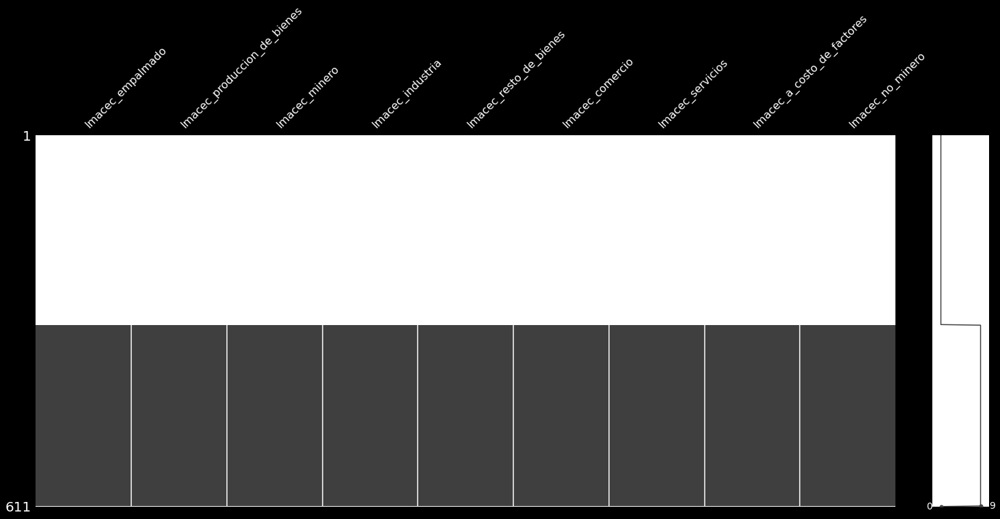

In [32]:
msno.matrix(df_bank[imacec_cols])

<AxesSubplot:>

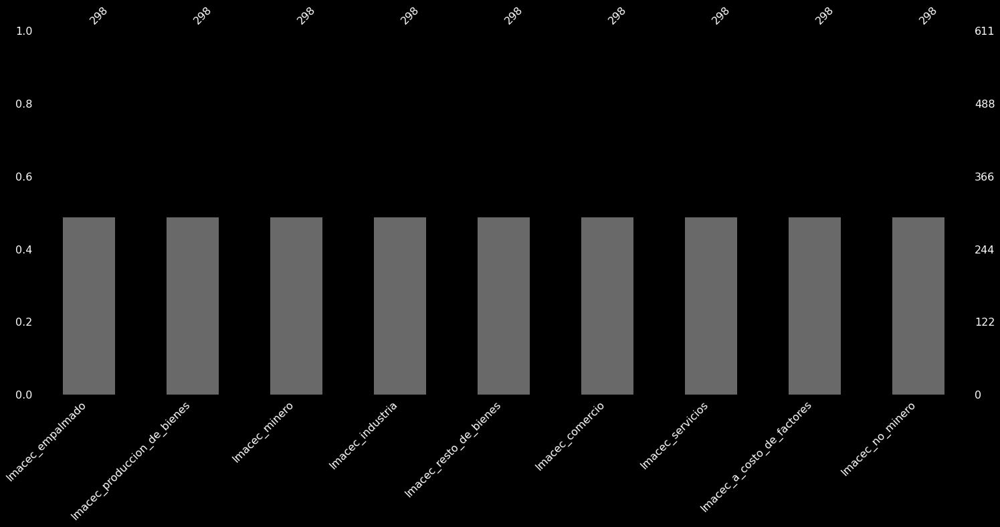

In [33]:
msno.bar(df_bank[imacec_cols])

#### 2.2.4.2 Columnas del PIB


Citá a: **https://economipedia.com/definiciones/producto-interior-bruto-pib.html**

El producto interior bruto (PIB) es un indicador económico que refleja el valor monetario de todos los bienes y servicios finales producidos por un país o región en un determinado periodo de tiempo, normalmente un año. Se utiliza para medir la riqueza que genera un país. También se conoce como producto bruto interno (PBI).

Según esta página, el PIB tiene múltiples formas de cálculo y además cada columna del PIB, puede poseer distintos rangos.

Para seguir con la misma idea de normalización que el IMACEC, haré que el factor divisor sea 10^5, con el fin que la función **reduction_factor** los normalice en el orden de 10^2, una vez aplicada esta función, en el momento hice una inspecciones visuales a los rangos en spyder (porque estas basuras de jupyter notebooks no sirven para nada [borrar después]), puliendo la limpieza de las columnas del IMACEC de manera individual.

Los rangos disponibles en las columnas PIB son desde Enero del 2013 hasta Septiembre del 2020.



In [34]:
def pib_values_cleaning(df, col):
    """
    Trata las columans del PIB del dataset del banco central

    Parameters
    ----------
    df : pandas.datframe
        Dataset de banco.
    col : string
        Nombre de la columna.

    Returns
    -------
    df : pandas.dataframe
         Dataset banco central con las columnas del PIB limpias.

    """
    # hacer el parsing de la columna como string
    df = string_parser(df, col)
    # divido en factor 10**5 para con la función estadarizar al [M]
    df[col] = df[col].apply(float) / 10**5
    # aplicar factor de amplificacion
    df[col] = df[col].apply(lambda x: reduction_factor(x))
    # correcciones particulares para cada columna para dejar en el rango
    if col == "PIB_Pesca":
        df[col] = df[col].apply(lambda x: 10 * x if x <= 150 else x)
    if col == "PIB_Refinacion_de_petroleo":
        df[col] = df[col].apply(lambda x: x / 10 if x >= 150 else x)
    if col == "PIB_Minerales_no_metalicos_y_metalica_basica":
        df[col] = df[col].apply(lambda x: 10 * x if x <= 150 else x)
    if col == "PIB_Construccion":
        df[col] = df[col].apply(lambda x: 10 * x if x <= 150 else x)
    if col == "PIB_Servicios_de_vivienda":
        df[col] = df[col].apply(lambda x: 10 * x if x <= 150 else x)
    if col == "PIB_Servicios_personales":
        df[col] = df[col].apply(lambda x: x / 10 if x >= 200 else x)
    return df


In [35]:
pib_cols = [col for col in df_bank.columns if "PIB" in col]
print(pib_cols)

['PIB_Agropecuario_silvicola', 'PIB_Pesca', 'PIB_Mineria', 'PIB_Mineria_del_cobre', 'PIB_Otras_actividades_mineras', 'PIB_Industria_Manufacturera', 'PIB_Alimentos', 'PIB_Bebidas_y_tabaco', 'PIB_Textil', 'PIB_Maderas_y_muebles', 'PIB_Celulosa', 'PIB_Refinacion_de_petroleo', 'PIB_Quimica', 'PIB_Minerales_no_metalicos_y_metalica_basica', 'PIB_Productos_metalicos', 'PIB_Electricidad', 'PIB_Construccion', 'PIB_Comercio', 'PIB_Restaurantes_y_hoteles', 'PIB_Transporte', 'PIB_Comunicaciones', 'PIB_Servicios_financieros', 'PIB_Servicios_empresariales', 'PIB_Servicios_de_vivienda', 'PIB_Servicios_personales', 'PIB_Administracion_publica', 'PIB_a_costo_de_factores', 'PIB']


#### 2.2.4.3 Columnas como precios, Indices, etc..

Por tiempo la función **values_treatement** incluye el mismo procesamiento para el resto de las columnas, pero una etapa siguiente a este jupyter notebook, sería mejorar individualemnte los rangos


In [36]:
def values_treatement(df):
    """
    Hacer el tratamiento de valores sobre el dataset del banco central

    Parameters
    ----------
    df : pandas.dataframe
        Data banco central.

    Returns
    -------
    df : pandas.dataframe
        Data banco central con las columnas tratadas.

    """
    # ordenar datos por fecha
    df.sort_values(by=["Periodo"], inplace=True, ascending=False)
    df.reset_index(drop=True, inplace=True)
    columns = list(df.columns)
    columns.remove("Periodo")
    for col in columns:
        # cada columna tiene un tratamiento distinto, dependiendo de lo que
        # corresponde
        if "Imacec" in col:
            print("Procesando columna IMACEC:", col)
            df = imacec_values_cleaning(df, col, thresh_imacec=20)
        elif "PIB" in col:
            print("Procesando una columna de PIB:", col)
            df = pib_values_cleaning(df, col)
        elif "Precio" in col:
            print("Procesando una columna de Precio:", col)
            # hacer el parsing de la columna como string
            df = string_parser(df, col)
            df[col] = df[col].apply(float) / 10 ** 5
            # aplicar factor de amplificacion
            df[col] = df[col].apply(lambda x: reduction_factor(x))
        else:
            print("Procesando una columna:", col)
            # hacer el parsing de la columna como string
            df = string_parser(df, col)
            df[col] = df[col].apply(float) / 10 ** 5
            # aplicar factor de amplificacion
            df[col] = df[col].apply(lambda x: reduction_factor(x))
    return df

#### 2.2.4.3 Comentarios e idea en general


La idea general, en el siguiente art attack se aprecian dos distribuciones, lo esperado que pase realmente y lo que me imagino que esta pasando por como venían los datos, que se espera que pase con las columnas es que posean una ditribución normal con media y varianza, que es lo que creo que pasa por como vienen los datos? --> Parte de los datos se va a el extremo menor de la distribución, debido que a que alcanza el rango adecuado con el factor de amplificación, por ejemplo:

Consideremos valores de las columnas IMACEC:

Tenemos dos strings "1010101" y "9410101", ambos con la misma cantidad de caracteres númericos, si a ambos le aplicamos el mismo factor reductor, ejemplo 10^5, tenemos el valor 10.10101 y 94.10101, esto es falso, debido a que el primer valor se pasó a la parte baja de la distribución, al saber un orden de magnitud adecuado, lo que podemos distinguir a es que el primer número debe ser reducido por 10^4 y el segundo por 10 ^ 5, de esta forma ambos números quedan en el mismo orden de magnitud, ejemplo. 101.0101 y 94.10101, lo cual es mucho más aceptable en este proceso de limpieza.

Se intenta encontrar estos factores reductores para cada columna, con el fin de dejar lo más normal posible la distribución de los datos.

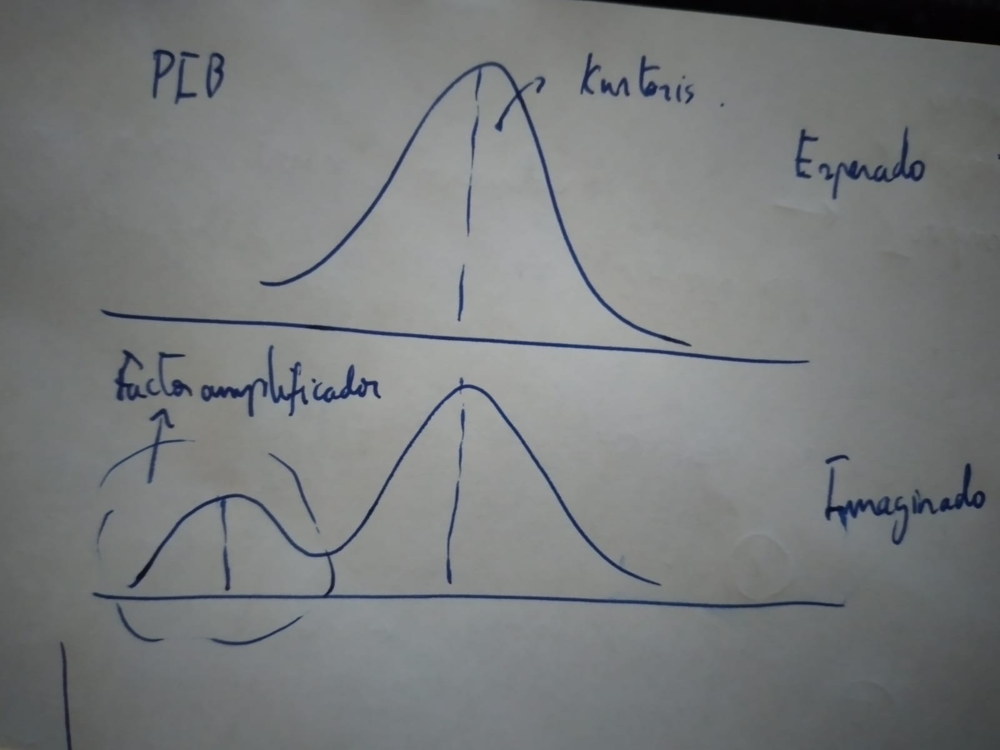


**IMACEC**
Los plots de missingo hacen visible la falta de datos en la columna IMACEC, yendo más al detalle desde los años 1970's a 1995's (dictadura?, coincidencia?, no lo creo ... [borrar después]) 
La idea, como se comentó en la sección anterior era dejarlos en el rango de 10^2, que es el rango en el cual se encuentran en los datos del banco central.

**PIB**

En el PIB se hace lo mismo hecho anteriormente, pero un tratamiento particular a cada columna, con el fin de limpiar outliers en columnas particulares del PIB

**Otras columnas**

Se hizo lo mismo anteriormente, pero por un tema de tiempo.


**Lo buscado**

Lo buscado es que los valores se concentren y sigan distribuciones lo mas normales posible, lo cual se verifica con el .describe(), en donde el cuartil 1 no debe alejarse mucho del 3 y en el pairplot se ve que las columnas se vuelven mucho más normales, me hubiera gustado hacer qq-plot en cada columna para hacer esta verificación, pero son 5 horas nomás xd

In [37]:
df_bank.columns

Index(['Periodo', 'Imacec_empalmado', 'Imacec_produccion_de_bienes',
       'Imacec_minero', 'Imacec_industria', 'Imacec_resto_de_bienes',
       'Imacec_comercio', 'Imacec_servicios', 'Imacec_a_costo_de_factores',
       'Imacec_no_minero', 'PIB_Agropecuario_silvicola', 'PIB_Pesca',
       'PIB_Mineria', 'PIB_Mineria_del_cobre', 'PIB_Otras_actividades_mineras',
       'PIB_Industria_Manufacturera', 'PIB_Alimentos', 'PIB_Bebidas_y_tabaco',
       'PIB_Textil', 'PIB_Maderas_y_muebles', 'PIB_Celulosa',
       'PIB_Refinacion_de_petroleo', 'PIB_Quimica',
       'PIB_Minerales_no_metalicos_y_metalica_basica',
       'PIB_Productos_metalicos', 'PIB_Electricidad', 'PIB_Construccion',
       'PIB_Comercio', 'PIB_Restaurantes_y_hoteles', 'PIB_Transporte',
       'PIB_Comunicaciones', 'PIB_Servicios_financieros',
       'PIB_Servicios_empresariales', 'PIB_Servicios_de_vivienda',
       'PIB_Servicios_personales', 'PIB_Administracion_publica',
       'PIB_a_costo_de_factores', 'Impuesto_al_valor

In [38]:
df_bank = values_treatement(df_bank)
print(df_bank.columns)

Procesando columna IMACEC: Imacec_empalmado
Procesando columna IMACEC: Imacec_produccion_de_bienes
Procesando columna IMACEC: Imacec_minero
Procesando columna IMACEC: Imacec_industria
Procesando columna IMACEC: Imacec_resto_de_bienes
Procesando columna IMACEC: Imacec_comercio
Procesando columna IMACEC: Imacec_servicios
Procesando columna IMACEC: Imacec_a_costo_de_factores
Procesando columna IMACEC: Imacec_no_minero
Procesando una columna de PIB: PIB_Agropecuario_silvicola
Procesando una columna de PIB: PIB_Pesca
Procesando una columna de PIB: PIB_Mineria
Procesando una columna de PIB: PIB_Mineria_del_cobre
Procesando una columna de PIB: PIB_Otras_actividades_mineras
Procesando una columna de PIB: PIB_Industria_Manufacturera
Procesando una columna de PIB: PIB_Alimentos
Procesando una columna de PIB: PIB_Bebidas_y_tabaco
Procesando una columna de PIB: PIB_Textil
Procesando una columna de PIB: PIB_Maderas_y_muebles
Procesando una columna de PIB: PIB_Celulosa
Procesando una columna de PIB:

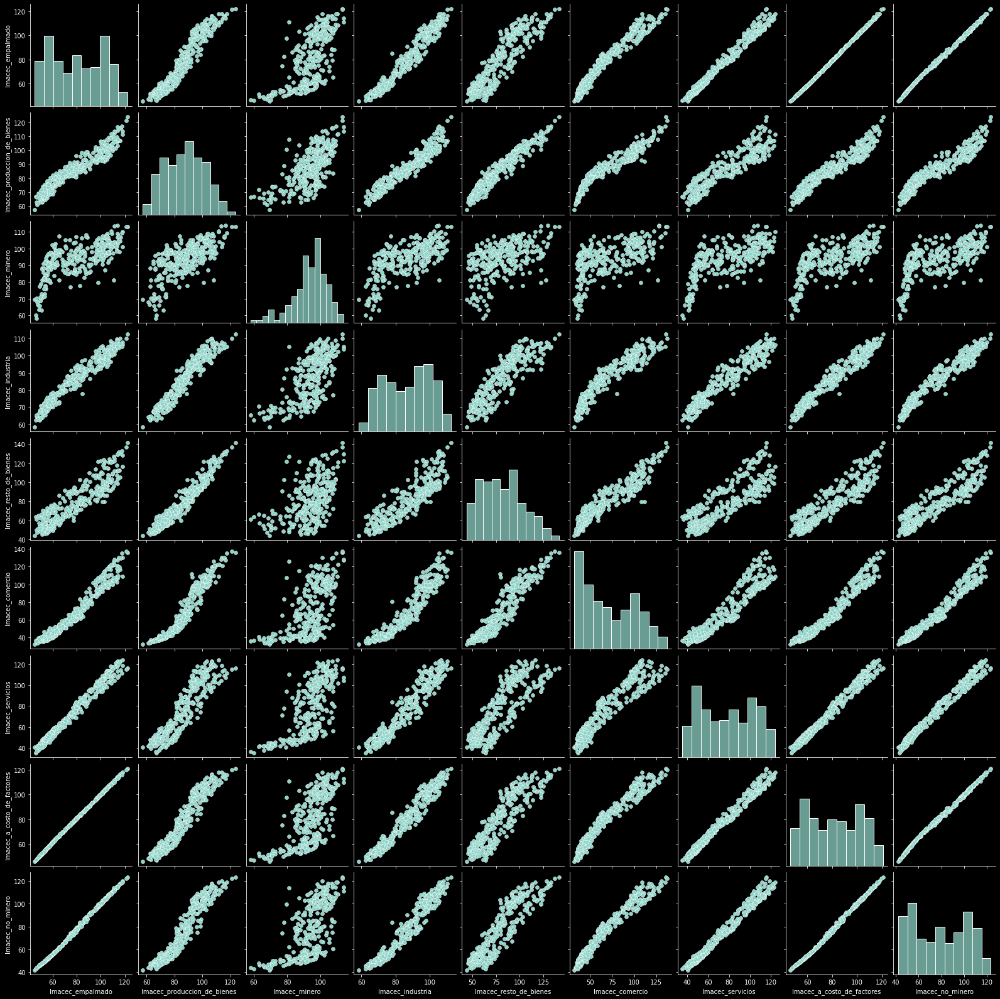

In [39]:
sns.pairplot(df_bank[imacec_cols])

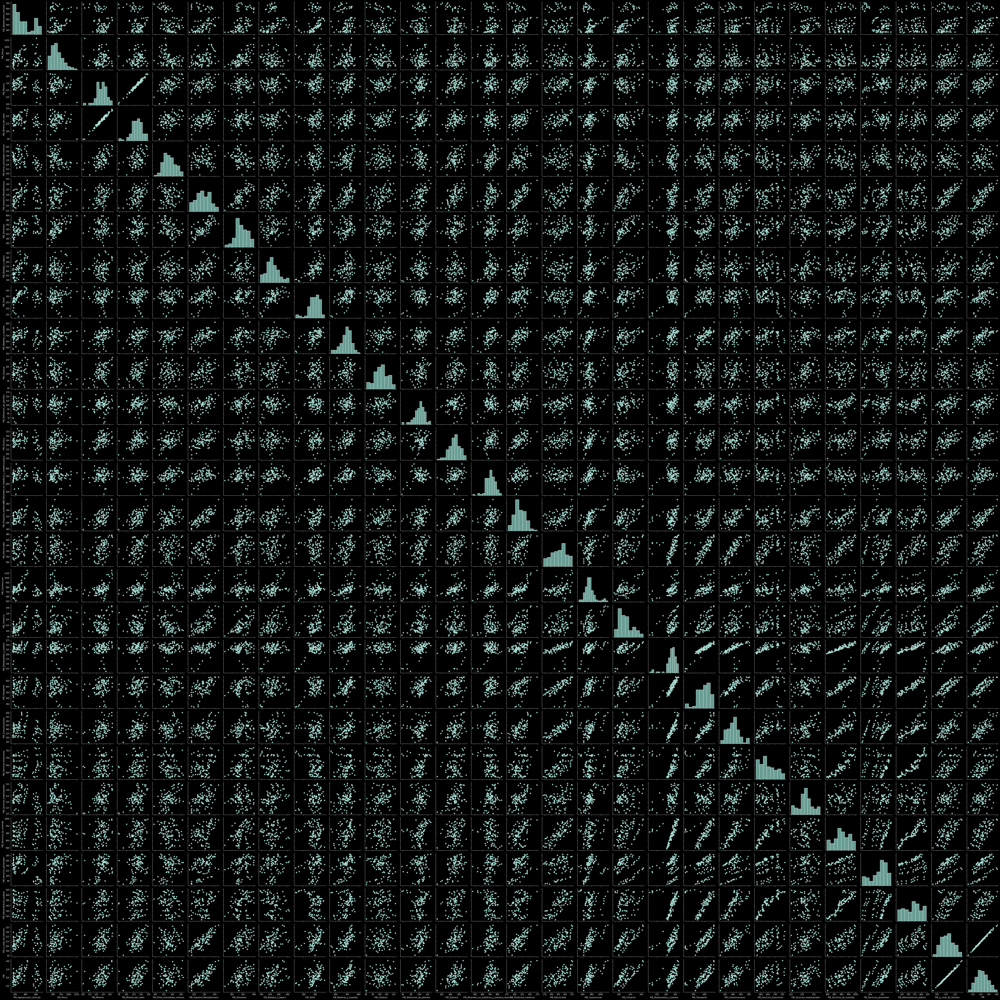

In [40]:
sns.pairplot(df_bank[pib_cols])

**Me aseguro que los datos que fueron preprocesados por la función anterior, en las columnas númericas sean valores flotantes**

In [41]:
def convert_df_float(df):
    """
    Convertir columnas de un dataframe en flotantes

    Parameters
    ----------
    df : pandas.dataframe
        Pasar todas las columnas de un dataset tabular a float.

    Returns
    -------
    df : pandas.dataframe
        Dataframe con las columnas transformadas a flotante.

    """
    for col in df.columns:
        try:
            df[col] = df[col].apply(float)
        except Exception:
            pass
    df.reset_index(drop=True, inplace=True)
    return df


In [42]:
df_bank = convert_df_float(df_bank)

In [43]:
df_bank[imacec_cols].describe()

,Imacec_empalmado,Imacec_produccion_de_bienes,Imacec_minero,Imacec_industria,Imacec_resto_de_bienes,Imacec_comercio,Imacec_servicios,Imacec_a_costo_de_factores,Imacec_no_minero
count,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000,298.000000
mean,80.897342,87.655607,93.505235,86.761279,82.001904,72.255500,78.687556,81.564817,79.045959
std,21.264741,13.770583,10.347718,13.241433,22.059939,28.620886,25.085937,20.666782,23.119289
min,45.351890,57.289238,58.149345,58.367705,44.074997,32.452114,35.480010,46.265293,42.156776
25%,60.151830,76.489538,88.256883,74.748768,64.070015,44.858989,54.805002,61.625864,56.021910
50%,80.326105,87.903321,95.399422,87.986424,79.995959,65.725453,78.997057,81.185091,78.314347
75%,100.670649,98.303609,100.541213,97.997912,96.546637,97.944824,101.943664,100.570457,100.524225
max,122.347724,123.733918,113.633912,112.460585,141.504351,137.234509,123.902119,120.908088,123.293139


In [44]:
df_bank[pib_cols].describe()

,PIB_Agropecuario_silvicola,PIB_Pesca,PIB_Mineria,PIB_Mineria_del_cobre,PIB_Otras_actividades_mineras,PIB_Industria_Manufacturera,PIB_Alimentos,PIB_Bebidas_y_tabaco,PIB_Textil,PIB_Maderas_y_muebles,...,PIB_Restaurantes_y_hoteles,PIB_Transporte,PIB_Comunicaciones,PIB_Servicios_financieros,PIB_Servicios_empresariales,PIB_Servicios_de_vivienda,PIB_Servicios_personales,PIB_Administracion_publica,PIB_a_costo_de_factores,PIB
count,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,...,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000,93.000000
mean,354.525985,632.301154,127.294956,114.086180,132.589453,128.711830,343.754614,165.472391,291.182067,690.320440,...,227.099128,591.975932,402.691129,647.182899,122.662823,900.961331,137.179534,565.791345,111.187680,121.578349
std,174.173859,182.021145,8.057707,7.405188,14.034376,6.494870,27.300876,14.598837,48.569397,46.705729,...,30.220015,57.160428,38.131428,54.450424,5.990059,53.677529,31.490337,31.759726,6.784634,7.631217
min,149.713225,342.580723,100.336697,89.409809,97.329706,115.437629,269.037610,137.193040,132.664027,561.712194,...,109.895312,424.641442,321.339691,565.071466,110.358845,793.471519,66.677663,506.965418,95.392417,104.022977
25%,209.516440,498.075834,123.033382,110.157514,123.093249,123.809203,325.455936,155.464493,266.575337,663.126423,...,219.138911,557.532119,376.315491,609.351789,119.281918,862.501728,116.566888,539.931126,106.169997,116.388398
50%,290.786889,593.380009,127.819883,115.237183,131.375147,128.643780,340.178603,164.911305,292.274656,695.300840,...,233.027794,596.476490,404.481308,636.285948,122.441225,900.771436,146.276553,571.629914,111.188756,121.503597
75%,533.636580,729.880253,132.492800,119.037951,140.700266,134.178070,364.609268,173.966600,328.198517,725.365110,...,245.471688,635.073000,422.285543,685.384556,125.792137,945.484562,161.272908,586.601268,115.619980,126.718108
max,704.614473,1257.234260,143.403422,128.746198,164.515187,143.627922,398.773275,204.002273,380.345362,811.197543,...,268.398632,683.658628,502.929296,767.636032,135.637537,999.642722,185.052449,619.801512,127.142142,140.573677


In [45]:
# Fechas comprendidas en los datos
print("Fecha inicial:", df_bank["Periodo"].min())
print("Fecha inicial:",df_bank["Periodo"].max())

Fecha inicial: 1970-01-01 00:00:00
Fecha inicial: 2020-11-01 00:00:00


**Creo una función que reciba un valor umbral como argumento y me permita determinar ¿cuales columnas cumplen con la condición de tener una menor porcentaje de nans que el umbral entregado como argumento?**

In [46]:
def actual_nans_df(df, threshold=50):
    """
    Dado un threshold de nans, devuelve las columnas que cumplen con el
    criterio porcentaje de nans <= threshold.

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe en el cual ver la cantidad de nans.
    threshold : float, optional
        Threshold de nans. The default is 50.

    Returns
    -------
    cols : list
        Lista de las columnas que cumplen con tener mejor cantidad de nans
        que el threhold establecido.

    """
    nans = pd.DataFrame(df.isna().sum(), columns=["missing"])
    nans.reset_index(drop=False, inplace=True)
    nans.rename(columns={"index": "columna"}, inplace=True)
    nans["porcentaje_nans"] = nans["missing"] / len(df) * 100
    cols = list(nans[nans["porcentaje_nans"] <= threshold]["columna"])
    return cols

In [47]:
actual_nans_df(df_bank, threshold=50)

['Periodo',
 'Precio_de_la_gasolina_en_EEUU_dolaresm3',
 'Precio_de_la_onza_troy_de_oro_dolaresoz',
 'Precio_de_la_onza_troy_de_plata_dolaresoz',
 'Precio_del_cobre_refinado_BML_dolareslibra',
 'Precio_del_petroleo_WTI_dolaresbarril',
 'Tipo_de_cambio_del_dolar_observado_diario',
 'Tipo_de_cambio_nominal_multilateral___TCM',
 'Indice_de_tipo_de_cambio_real___TCR_promedio_1986_100',
 'Indice_de_produccion_industrial__mineria',
 'Indice_de_produccion_industrial__manufacturera']

In [48]:
actual_nans_df(df_bank, threshold=90)

['Periodo',
 'Imacec_empalmado',
 'Imacec_produccion_de_bienes',
 'Imacec_minero',
 'Imacec_industria',
 'Imacec_resto_de_bienes',
 'Imacec_comercio',
 'Imacec_servicios',
 'Imacec_a_costo_de_factores',
 'Imacec_no_minero',
 'PIB_Agropecuario_silvicola',
 'PIB_Pesca',
 'PIB_Mineria',
 'PIB_Mineria_del_cobre',
 'PIB_Otras_actividades_mineras',
 'PIB_Industria_Manufacturera',
 'PIB_Alimentos',
 'PIB_Bebidas_y_tabaco',
 'PIB_Textil',
 'PIB_Maderas_y_muebles',
 'PIB_Celulosa',
 'PIB_Refinacion_de_petroleo',
 'PIB_Quimica',
 'PIB_Minerales_no_metalicos_y_metalica_basica',
 'PIB_Productos_metalicos',
 'PIB_Electricidad',
 'PIB_Construccion',
 'PIB_Comercio',
 'PIB_Restaurantes_y_hoteles',
 'PIB_Transporte',
 'PIB_Comunicaciones',
 'PIB_Servicios_financieros',
 'PIB_Servicios_empresariales',
 'PIB_Servicios_de_vivienda',
 'PIB_Servicios_personales',
 'PIB_Administracion_publica',
 'PIB_a_costo_de_factores',
 'Impuesto_al_valor_agregado',
 'Derechos_de_Importacion',
 'PIB',
 'Precio_de_la_gaso

In [49]:
actual_nans_df(df_bank, threshold=30)

['Periodo',
 'Precio_de_la_gasolina_en_EEUU_dolaresm3',
 'Precio_de_la_onza_troy_de_oro_dolaresoz',
 'Precio_de_la_onza_troy_de_plata_dolaresoz',
 'Precio_del_cobre_refinado_BML_dolareslibra',
 'Precio_del_petroleo_WTI_dolaresbarril',
 'Tipo_de_cambio_del_dolar_observado_diario']

In [50]:
actual_nans_df(df_bank, threshold=15)

['Periodo',
 'Precio_de_la_gasolina_en_EEUU_dolaresm3',
 'Precio_de_la_onza_troy_de_oro_dolaresoz',
 'Precio_de_la_onza_troy_de_plata_dolaresoz',
 'Precio_del_cobre_refinado_BML_dolareslibra']

<AxesSubplot:>

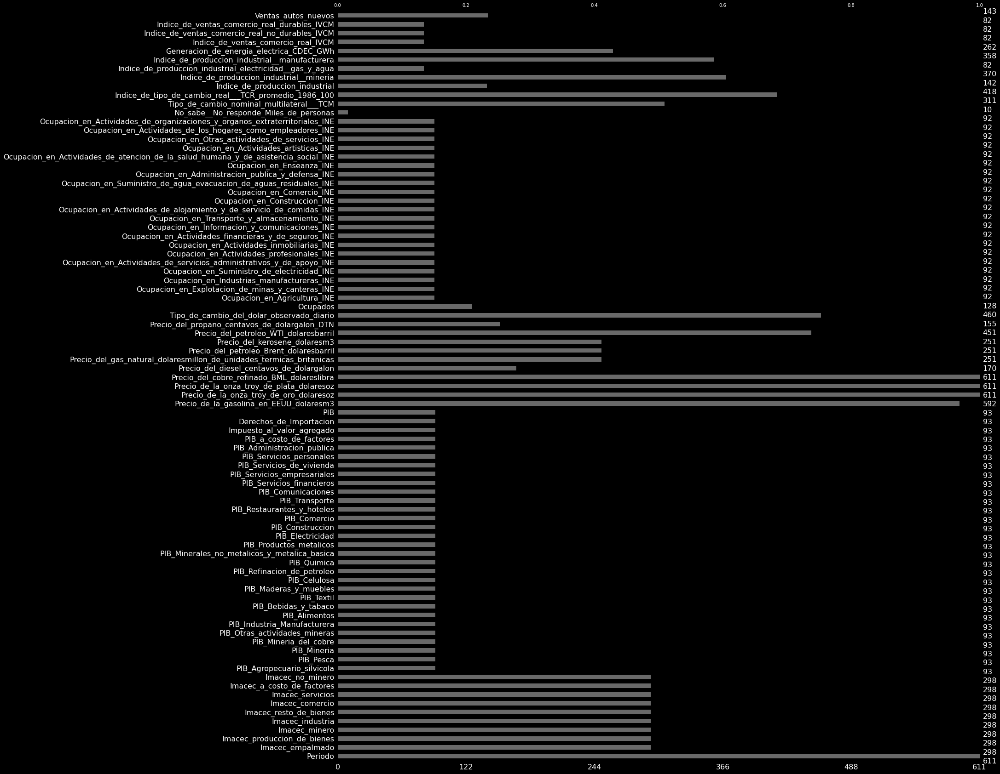

In [51]:
msno.bar(df_bank)

Son hartas las columnas, que poseen un porcentaje elevado de valores faltantes, esto será una consideración importante más adelante en la etapa de feature engineering y elección de modelos

# 3. Visualización

## 3.1 Crea una función que permita graficar series históricas de precipitaciones para un rango de fechas determinado.

Para esto la función debe recibir como argumentos el nombre de una región, fecha de inicio y fecha de término (asegúrate de verificar en tu función que tanto el nombre de la región como las fechas ingresadas existan en el dataset).

In [52]:
def historical_time_series_plot(df, region, initial_date, end_date,
                                fontsize=12, window_size=12):
    """
    Graficar e precipitaciones historicas en un rango determinado de fechas
    determinado

    Parameters
    ----------
    df : pandas.dataframe
        Dataset de precipitaciones.
    region : string
        Nombre de la region.
    initial_date : string
        Fecha de inicio del gráfico.
    end_date : string
        Fecha de fin del gráfico.
    fontsize : int, optional
        Tamaño de la letra. The default is 12.
    window_size : int, optional
        Tamaño de la ventana temporal para ver media movil. The default is 5.
    fontsize : int
        Tamaño de la letra.

    Returns
    -------
    Visualización de la serie historica.

    """
    # ordenar valores por por tiempo
    df.sort_values(by=["date"], inplace=True, ascending=True)
    df.reset_index(drop=True, inplace=True)
    # transformar fechas a formato datetime
    initial_date = datetime.strptime(str(initial_date)[0:10], '%Y-%m-%d')
    end_date = datetime.strptime(str(end_date)[0:10], '%Y-%m-%d')
    # verificar limites de fechas
    initial_date = max(initial_date, df['date'].min())
    end_date = min(end_date, df['date'].max())
    # Media movil para ver tendencias
    df["moving_"+region] = df[region].rolling(window=window_size).mean()
    # filtrar los datos
    df_filter = df[(df['date'] <= end_date) & (df['date'] >= initial_date)]
    try:
        labels = df_filter['date'].apply(lambda x: str(x)[0:10]).to_list()
        rain = df_filter[region].to_list()
        moving = df_filter["moving_"+region].to_list()
        # sacar la columna
        df.drop(columns=["moving_"+region], inplace=True)
        df_filter.drop(columns=["moving_"+region], inplace=True)
        fig, ax = plt.subplots(1, figsize=(20, 12))
        ax.plot(labels, rain, 'blue', linewidth=2)
        ax.plot(labels, moving, 'orangered', linewidth=2)

        ax.set_xlabel('Tiempo', fontname="Arial", fontsize=fontsize)
        ax.set_ylabel(f'Precipitaciones mensuales {region}',
                      fontname="Arial", fontsize=fontsize+2)
        max_date, min_date = str(initial_date)[0:10], str(end_date)[0:10]
        ax.legend([region, f"Media Movil {str(window_size)} meses"],
                  loc='upper left',
                  prop={'size': fontsize+5})
        region = region.replace("_", " ").title()
        title =\
            f"Precipitaciones mm desde {min_date} hasta {max_date} | Región {region}"
        ax.set_title(title,
                     fontname="Arial", fontsize=fontsize+10)
        # Tamaño de los ejes
        for tick in ax.get_xticklabels():
            tick.set_fontsize(fontsize-2)
        for tick in ax.get_yticklabels():
            tick.set_fontsize(fontsize-2)
        plt.xticks(rotation=75)
        plt.show()
    except Exception as e:
        print(e)
        print("La región ingresada no se encuentra disponible en los datos")


### 3.2 Usa esta función para graficar las precipitaciones para la Región Libertador General Bernardo O'Higgins y para la Región Metropolitana entre las fechas 2000-01-01 y 2020-01-01.

¿ Qué observas con respecto a estacionalidades y tendencias?

### 3.2.1 Región Metropolitana

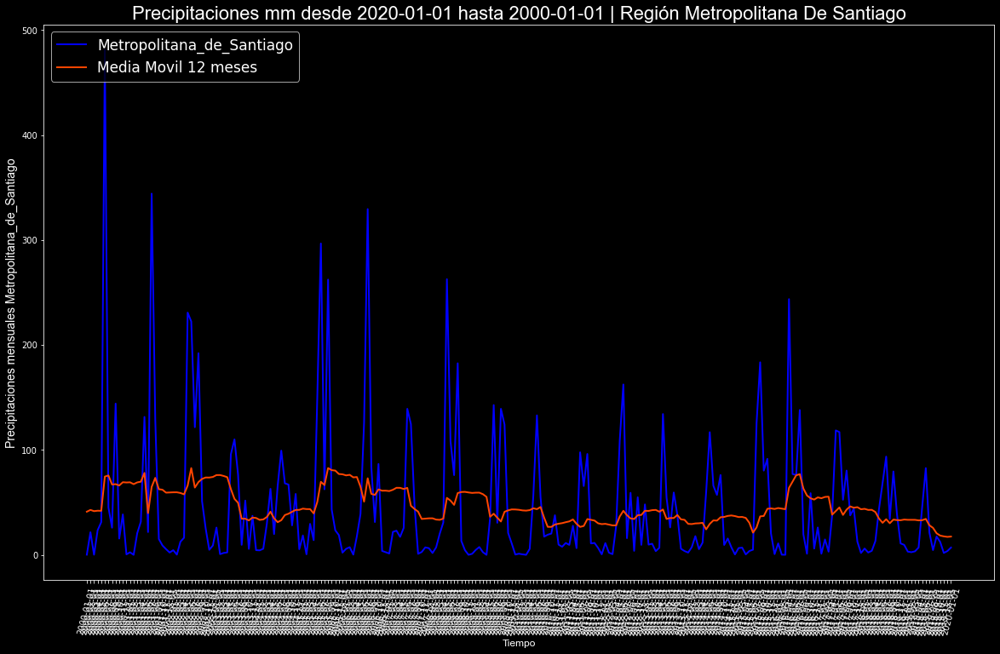

In [53]:
initial_date = '2000-01-01'
end_date = '2020-01-01'
region = 'Metropolitana_de_Santiago'
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=12)

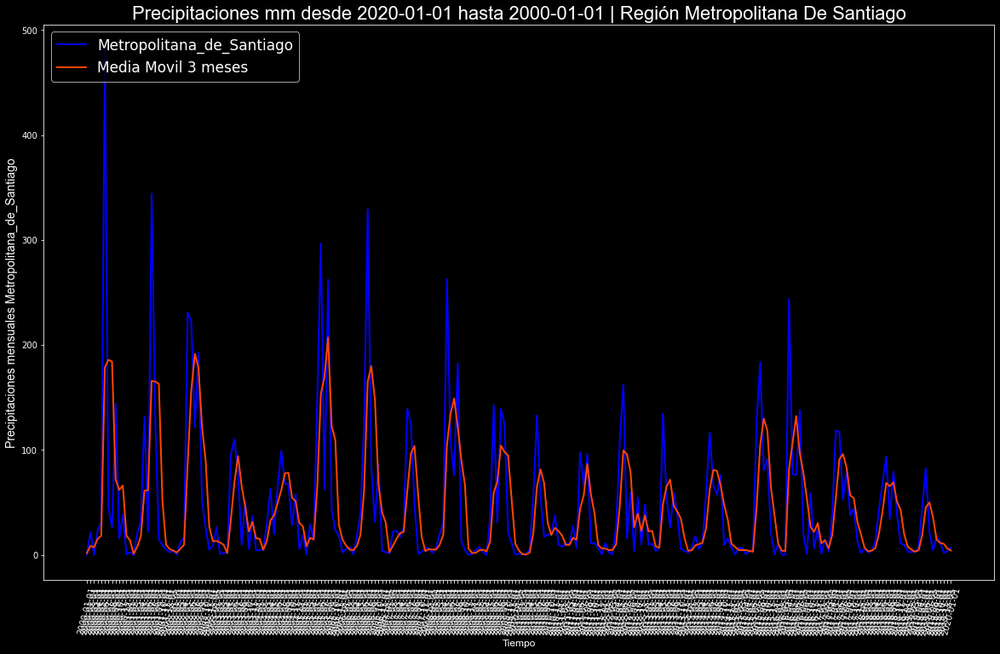

In [54]:
# Gráfico para ver la media movil en 3 meses (observar estacionalidades) 
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=3)

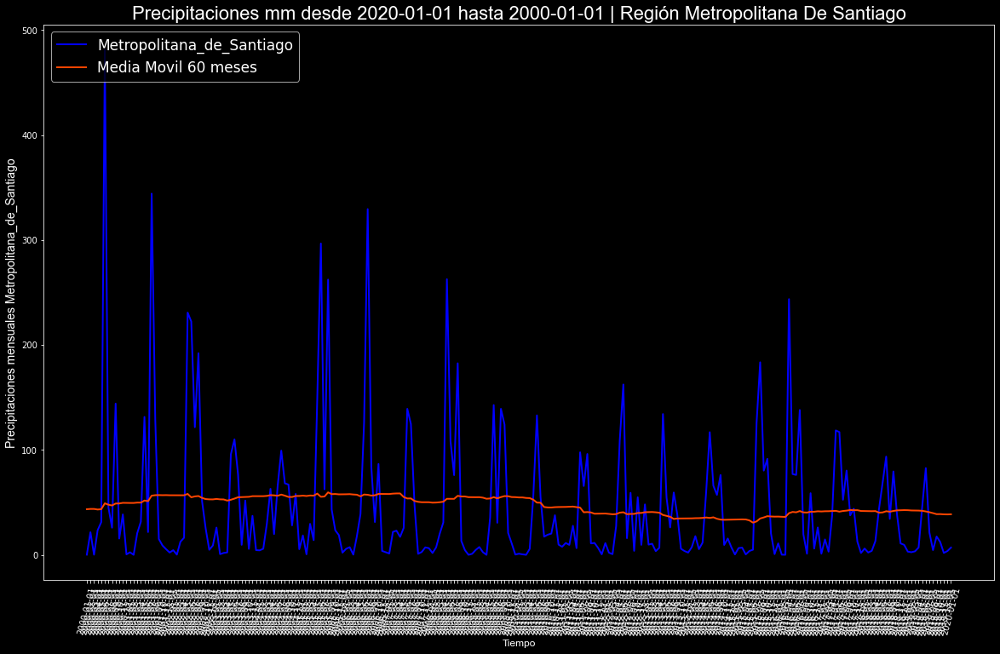

In [55]:
# Observar la media movil de 5 años con el fin de ver tendencias
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=12*5)

### 3.2.2 Región De Bernardo O'Higgins 

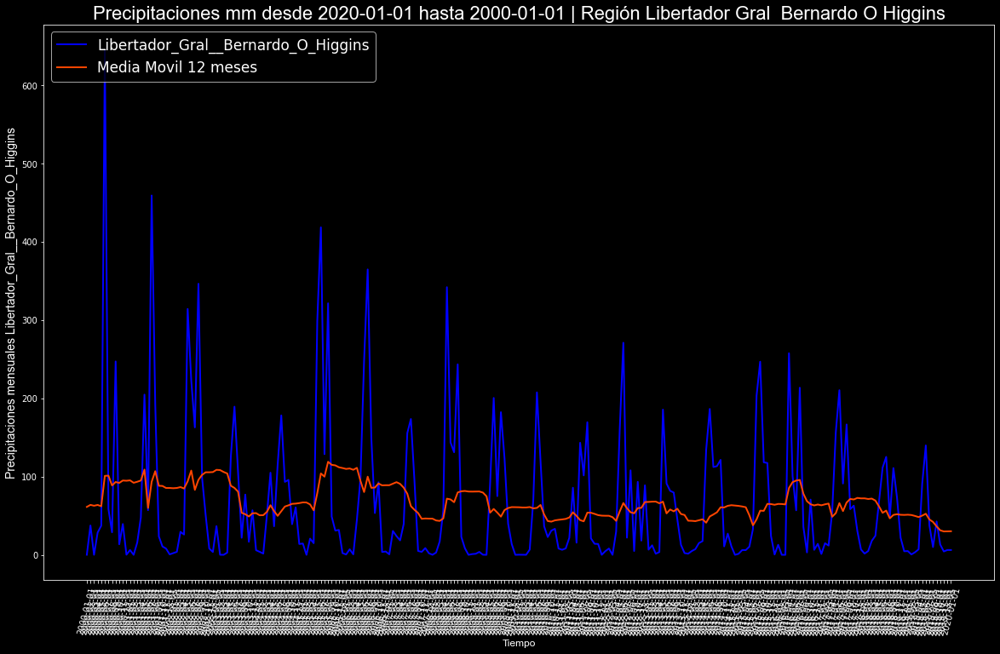

In [56]:
region = 'Libertador_Gral__Bernardo_O_Higgins'
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=12)

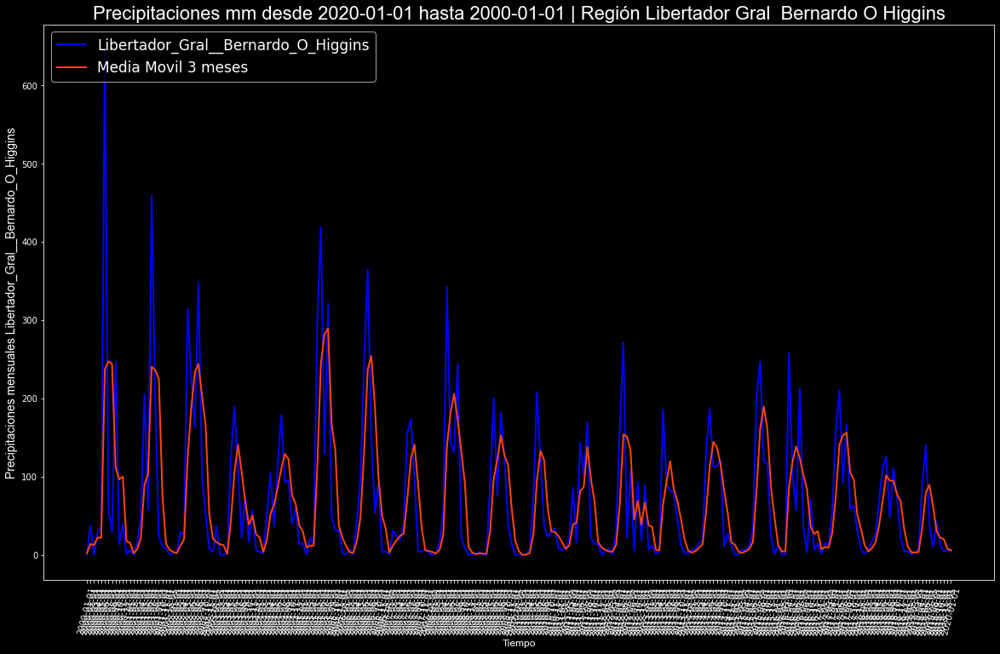

In [57]:
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=3)

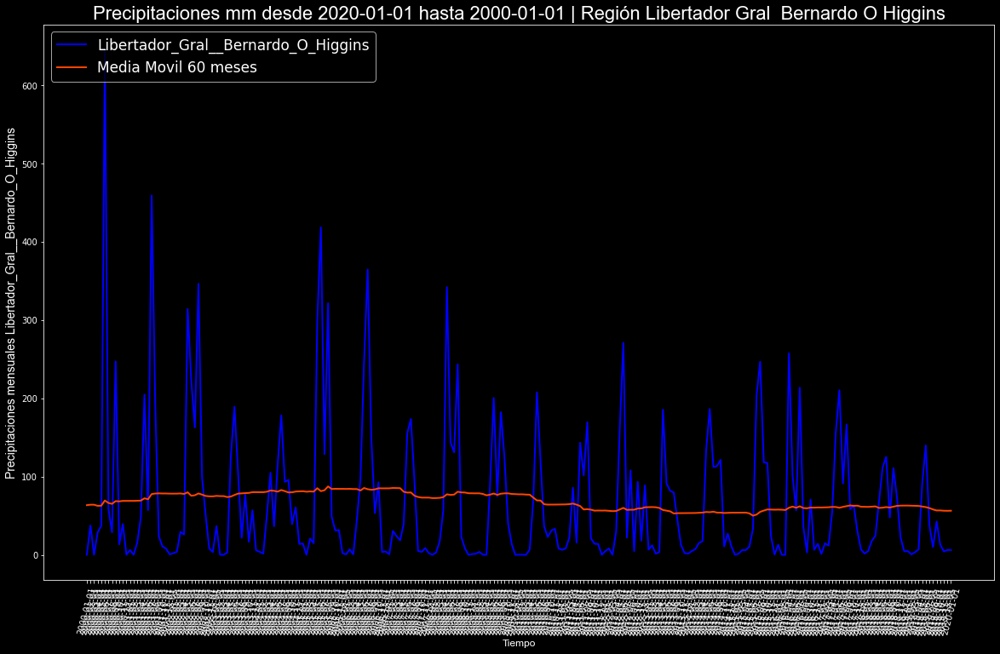

In [58]:
historical_time_series_plot(df_pr, region, initial_date, end_date, window_size=12*5)

Se observan estacionalidades que coinciden con los ciclos de las estaciones verano-otoño-invierno-primavera, esto se verifica al observar la media movil de 3 meses.

A través de la media movil de 60 meses (5 años), que las precipitaciones mensuales han ido a la baja, de manera muy disimulada, pero han ido decreciendo.

Se propone hacer un test de es estacionaridad de ambas seríes con el fin de discutir si la desviación estandar y la media han variado en el tiempo.

In [59]:
from statsmodels.tsa.stattools import adfuller


def stationary_adf_test(df, cols):
    """
    Test de estacionaridad
    Augmented Dickey-Fuller puede ser una de las más utilizadas.
    Utiliza un modelo autorregresivo y optimiza un criterio de información
    a través de múltiples valores de retardo (lags) diferentes.

    La hipótesis nula de la prueba es que la serie de tiempo se puede
    representar mediante una raíz unitaria, que no es estacionaria
    (tiene alguna estructura dependiente del tiempo).

    La hipótesis alternativa (que rechaza la hipótesis nula) es que la serie
    de tiempo es estacionaria.

    * Hipótesis nula (H0): si no se rechaza, sugiere que la serie de tiempo
    tiene una raíz unitaria, lo que significa que no es estacionaria.
    Tiene alguna estructura dependiente del tiempo.

    * Hipótesis alternativa (H1): Se rechaza la hipótesis nula; sugiere que
    la serie de tiempo no tiene una raíz unitaria, lo que significa que es
    estacionaria. No tiene una estructura dependiente del tiempo.

    Voy a interpretar este resultado utilizando el valor p de la prueba.
    Un valor p por debajo de un umbral (como 5% o 1%) sugiere que rechazamos

    la hipótesis nula (estacionaria); de lo contrario, un valor p por encima
    del umbral sugiere que no rechazamos la hipótesis nula (no estacionaria),
    este es el lo clásico en tests estadísticos.

    * Valor p> 0.05: No se rechaza la hipótesis nula (H0),
    los datos no son estacionarios
    * Valor de p <= 0.05: Rechaza la hipótesis nula (H0),
    los datos son estacionarios

    Parameters
    ----------
    df : pandas.dataframe
        dataframe al cual se le harán pruebas de estacionaridad a todas sus
        columnas.
    cols : list
        Lista de columnas.

    Returns
    -------
    output : pandas.dataframe
        Resultados del test.

    """
    output = []
    for col in cols:
        try:
            datai = df[[col]]
            # datai = datai[datai[col] > 0]
            result = adfuller(datai.values)
            # descomprimir valores
            p = result[1]
            print("Para la columna: ", col)
            print(comentary_stationarity(p))
            print('ADF estadisticas: %f' % result[0])
            print('Valor de p: %f' % result[1])
            print('Valores criticos:')
            for key, value in result[4].items():
                print('\t%s: %.3f' % (key, value))
            output.append([col, comentary_stationarity(p),
                          p, list(result[4].items())])
        except Exception:
            print("No hubo convergencia")
    output = pd.DataFrame(output, columns=["columna", "resultado",
                                           "valor_p", "intervalos"])
    return output


def comentary_stationarity(p):
    """
    Comentario de la estacionaridad de las
    Parameters
    ----------
    p : TYPE
        DESCRIPTION.
    Returns
    -------
    comments : TYPE
        DESCRIPTION.
    """
    if p <= 0.05:
        comments = "Rechaza la hipótesis nula (H0), los datos son estacionarios"
    else:
        comments = "No se rechaza la hipótesis nula (H0), los datos no son estacionarios"
    return comments


In [60]:
cols = ['Metropolitana_de_Santiago', 'Libertador_Gral__Bernardo_O_Higgins']
stationarity_test = stationary_adf_test(df_pr, cols)

Para la columna:  Metropolitana_de_Santiago
Rechaza la hipótesis nula (H0), los datos son estacionarios
ADF estadisticas: -5.589755
Valor de p: 0.000001
Valores criticos:
	1%: -3.444
	5%: -2.868
	10%: -2.570
Para la columna:  Libertador_Gral__Bernardo_O_Higgins
Rechaza la hipótesis nula (H0), los datos son estacionarios
ADF estadisticas: -5.538912
Valor de p: 0.000002
Valores criticos:
	1%: -3.444
	5%: -2.868
	10%: -2.570


**Ambas series de tiempo son estacionarias !**, media y varianza constantes en el tiempo

### 3.3 Crea una función que, para una región, grafique múltiples series de tiempo mensuales de precipitaciones

Donde cada serie de tiempo corresponda a un año. La función debe recibir como argumento una lista con los años que queremos graficar (2000, 2005,..) y el nombre de la región. El eje X debe indicar los meses (enero, febrero, etc…).

In [61]:
def get_historical_data(df, region, initial_date, end_date):
    """
    Obtener información historica, de las precipitaciones para una región 
    en particular

    Parameters
    ----------
    df : pandas.dataframe
        Dataset de las precipitaciones.
    region : string
        Nombre de la región.
    initial_date : string
        Fecha inicial.
    end_date : string
        Fecha Final.

    Returns
    -------
    list
        Lista de los meses.
    list
        Lista de las precipitaciones.

    """
    # transformar fechas a formato datetime
    initial_date = datetime.strptime(str(initial_date)[0:10], '%Y-%m-%d')
    end_date = datetime.strptime(str(end_date)[0:10], '%Y-%m-%d')
    # verificar limites de fechas
    initial_date = max(initial_date, df['date'].min())
    end_date = min(end_date, df['date'].max())
    df_filter = df[(df['date'] <= end_date) & (df['date'] >= initial_date)]
    months = ['enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio', 'julio',
              'agosto', 'septiembre', 'octubre', 'noviembre', 'diciembre']
    df_filter['mes'] = df_filter['date'].apply(lambda x: months[x.month-1])
    return df_filter['mes'].to_list(), df_filter[region].to_list()


def plot_anual_time_series(df, years_list, region):
    """
    Hacer el gráfico anual como se pide en el desafio

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe de las precipitaciones.
    years_list : list
        Lista con los años a plotear.
    region : string
        Nombre de la región.

    Returns
    -------
    Gráfica a nivel mensual de los años.

    """
    try:
        plt.figure(figsize=(22, 10))
        for year in years_list:
            initial_date = f"{year}-01-01"
            end_date = f"{year}-12-01"
            months, data = get_historical_data(
                df, region, initial_date, end_date)
            plt.plot(months, data)

        plt.legend(years_list)
        plt.xticks(rotation=90)
        plt.xlabel('Fecha')
        plt.ylabel('Precipitaciones mensual')

        title =\
            f"Precipitaciones mm desde {years_list[0]} hasta {years_list[-1]} de {region}"
        plt.title(title)
        plt.show()
    except Exception as e:
        print(e)
        print("La región ingresada no se encuentra en los datos")

### 3.4 Usa esta función para graficar las precipitaciones para la Región del Maule durante los años 1982, 1992, 2002, 2012 y 2019.

¿Qué puedes concluir de estos gráficos?

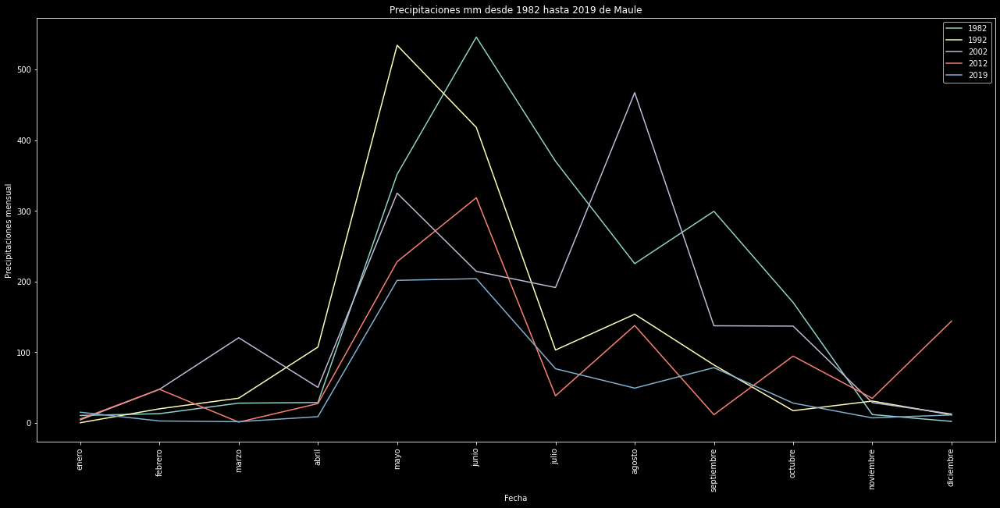

In [62]:
plot_anual_time_series(df_pr,['1982','1992','2002', '2012', '2019'], 'Maule')

Las precipitaciones en 2019 fueron las más bajas registradas en todos los años, de los cuales desde el año 2012 fueron decreciendo de manera abrupta, esto es la comprabación de una escasez hídrica en la zona del maule (**https://www.bcn.cl/siit/actualidad-territorial-19-5-2015/emergencia-hidrica-sequia-en-la-zona-central-del-pais-1**, en este articulo señalan la sequía a partir del 2011).

Podemos observar un desplazamiento de las precipitaciones máximas entre los meses de mayo a septiembre, lo cual ha ida alargando el periodo de invierno. 

[Me dio pena el gráfico, es clara consecuencia del cambio clímatico uwu] 


### 3.5 Crea una función que permita visualizar dos series históricas de PIB para un rango de fechas determinado. Para esto la función debe recibir como input el nombre de cada serie, fecha de inicio y fecha de término.

In [63]:
def pib_time_series_plot(df, pib_name, initial_date, end_date, fontsize=12):
    """
    Graficar el PIB historico en un rango determinado de fechas
    determinado

    Parameters
    ----------
    df : pandas.dataframe
        Dataset de precipitaciones.
    pib_name : string
        Nombre de la pib_name.
    initial_date : string
        Fecha de inicio del gráfico.
    end_date : string
        Fecha de fin del gráfico.
    fontsize : int, optional
        Tamaño de la letra. The default is 12.
    fontsize : int
        Tamaño de la letra.

    Returns
    -------
    Visualización de la serie historica.

    """
    # ordenar valores por por tiempo
    df.sort_values(by=["Periodo"], inplace=True, ascending=True)
    df.reset_index(drop=True, inplace=True)
    # transformar fechas a formato datetime
    initial_date = datetime.strptime(str(initial_date)[0:10], '%Y-%m-%d')
    end_date = datetime.strptime(str(end_date)[0:10], '%Y-%m-%d')
    # verificar limites de fechas
    initial_date = max(initial_date, df['Periodo'].min())
    end_date = min(end_date, df['Periodo'].max())
    # filtrar los datos
    df_filter = df[(df['Periodo'] <= end_date) &
                   (df['Periodo'] >= initial_date)]
    try:
        labels = df_filter['string_fechas'].apply(
            lambda x: str(x)[0:10]).to_list()
        rain = df_filter[pib_name].to_list()
        fig, ax = plt.subplots(1, figsize=(20, 12))
        ax.plot(labels, rain, 'blue', linewidth=2)
        ax.set_xlabel('Tiempo', fontname="Arial", fontsize=fontsize)
        ax.set_ylabel(f'PIB {pib_name}',
                      fontname="Arial", fontsize=fontsize+2)
        max_date, min_date = str(initial_date)[0:10], str(end_date)[0:10]
        ax.legend([pib_name], loc='upper left', prop={'size': fontsize+5})
        pib_name = pib_name.replace("_", " ").title()
        title = f"PIB desde {min_date} hasta {max_date}"
        ax.set_title(title, fontname="Arial", fontsize=fontsize+10)
        # Tamaño de los ejes
        for tick in ax.get_xticklabels():
            tick.set_fontsize(fontsize-2)
        for tick in ax.get_yticklabels():
            tick.set_fontsize(fontsize-2)
        plt.xticks(rotation=75)
        plt.show()
    except Exception as e:
        print(e)
        print("La región ingresada no se encuentra disponible en los datos")


### 3.6 Grafica las series de tiempo del PIB agropecuario y silvícola y la del PIB de Servicios financieros desde el 2013-01-01 hasta la fecha más reciente en que haya datos.

o ¿Qué puedes decir de cada serie en particular?

o ¿Hay alguna relación entre estas dos series?

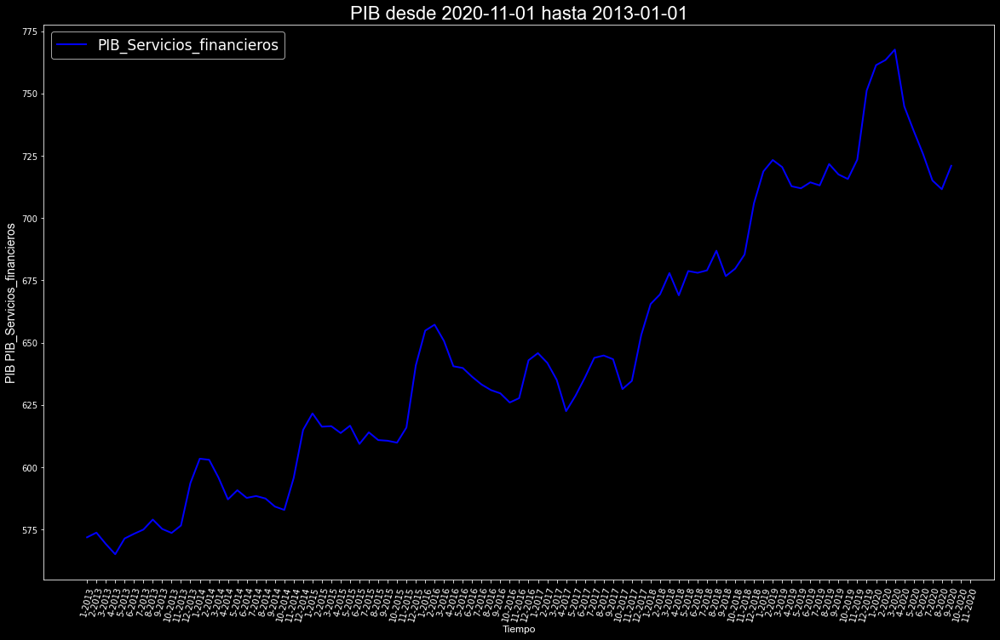

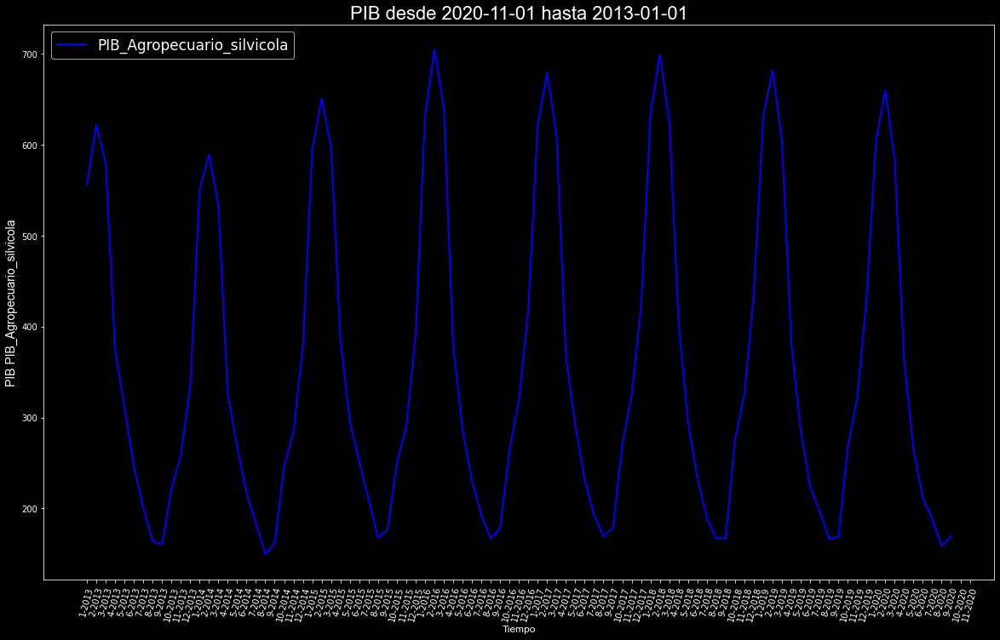

In [64]:
pib_columns = ['PIB_Servicios_financieros','PIB_Agropecuario_silvicola']
initial_date = '2013-01-01'
end_date = df_bank['Periodo'].max().strftime('%Y-%m-%d')

# crear el label del gráfico
df_bank['string_fechas'] = df_bank['Periodo'].apply(lambda x: str(x.month)+'-'+str(x.year))


for col in pib_columns:
    pib_time_series_plot(df_bank, col, initial_date, end_date)

Para la serie de PIB Servicios financieros se visualiza estacionalidad y tendencia creciente. La serie posee ciclos de un áno, en donde de noviembre a enero aumenta su valor.

Para la serie de tiempo de PIB a agropecuario silviola muestra estacionalidad de 1 año muy marcada, el orden de magnitud de esta serie esta limitada por su tratamiento que alzanza pics de 600.

Las series se relacionan en que los peaks de los periodos se alcanzan en el mes de Enero y luego comienzan a disminuir relativamente hasta Septiembre.


# 4. Tratamiento y creación de variables

### 4.1 ¿Cómo podríamos evaluar la correlación entre las distintas series de tiempo y cómo se tienen que correlacionar para entrenar un modelo? ¿Mucha correlación, no correlacionadas, da igual?

La correlación entre las distintas series de tiempo puede ser evaluada a través de el método más tradicional de correlación lineal, que es el coeficiente de pearson, el coeficiente de correlación de Pearson (r) es una medida de correlación lineal entre dos variables. Su valor se encuentra entre -1 y +1, -1 indica una correlación lineal negativa total, 0 indica que no hay correlación lineal y 1 indica una correlación lineal positiva total. Además, r es invariante bajo cambios separados en la ubicación y escala de las dos variables, lo que implica que para una función lineal el ángulo con el eje x no afecta a r.

En series de de tiempo se tiene la componente temporal, por lo que el análisis de correlación no es tan inmediato, por lo general se propone el cálculo de la autocorrelación (En estadística, la autocorrelación de una serie temporal discreta de un proceso Xt no es más que simplemente la correlación de dicho proceso con una versión desplazada en el tiempo de la propia serie temporal) y posiblemente estudiar la correlación cruzada con las otras series de tiempo. 

De manera general features que tienen una correlación elevada, entregan información redundante a los modelos, por lo que no ayudan en la capacidad de predicción de un modelo, esto es conocido como el problema de la colinealidad, por ejemplo en modelos lineales (regresiones lineales), el que dos variables estén correlacionadas, implica que una puede ser descrita como combinación lineal de la otra, dejando que la matriz que describe el problema de regresión la matriz D es casi-singular, es decir su determinante no es cero pero es muy pequeño. Como para invertir una matriz hay que dividir por su determinante, en esta situación surgen problemas de precisión en la estimación de los coeficientes, ya que los algoritmos de inversión de matrices pierden precisión al tener que dividir por un número muy pequeño, siendo además inestables.

Otros modelos como los arboles de decisión son por naturaleza inmunes a la multicolinealidad. Por ejemplo, si tiene 2 características que están 99% correlacionadas, al decidir sobre una división, el árbol elegirá solo una de ellas. 

Dado que los árboles potenciados utilizan árboles de decisión individuales, tampoco se ven afectados por la multicolinealidad. Sin embargo, es una buena práctica eliminar cualquier característica redundante de cualquier conjunto de datos utilizado para el entrenamiento, independientemente del algoritmo del modelo. En su caso, ya que está obteniendo nuevas características, puede usar este enfoque, evaluar la importancia de cada característica y conservar solo las mejores características para su modelo final.

En redes neuronales a veces cuando la correlación no es al 100 % estás pueden ayudar a mejorar los resultados de los modelos, aunque la respuesta no es muy clara en este sentido, en mi experiencia, cuando doy más parámetros a la red, más, de los que en verdad el problema necesita y entrego caracteristicas con mucha correlación, esto me ha ayudado a mejorar los resultados de modelos (ojo que no hablo de hacer overffit en el modelo), solo que con más parámetros y suficientes datos, hace que el modelo mejore. Esto es un tema muy largo, en que en redes neuronales, la respuesta es casi siempre experimental.







In [65]:
from matplotlib import cm as cm
plt.style.use('dark_background')


def correlation_matrix(df, method="pearson"):
    """
    Hacer matriz de correlaciones según distintos métodos de correlación,
    para analizar a simple vista los datos

    Parameters
    ----------
    df : dataframe
        dataset que estamos analizando.
    method : string, optional
        método de correlación soportados por libreria pandas
        {‘pearson’, ‘kendall’, ‘spearman’} .
        The default is "pearson".

    Returns
    -------
        Plot de matplotlib.pyplot de la matriz de correlación.

    """
    letter_size = 30
    fig = plt.figure(figsize=(70, 70))
    ax = fig.add_subplot(111)
    cmap = cm.get_cmap('hot_r', 30)
    ax = fig.add_subplot(111)
    size = int(len(list(df.columns))/2)
    corr = df.corr(method=method)
    fig, ax = plt.subplots(figsize=(size, size))
    # ax.matshow(corr, cmap=cmap)
    sns.heatmap(corr, annot=True, cmap=cmap)
    plt.xticks(range(len(corr.columns)), corr.columns, fontsize=letter_size)
    plt.yticks(range(len(corr.columns)), corr.columns, fontsize=letter_size)
    ax.set_xticklabels(df.columns, fontsize=letter_size)
    ax.set_yticklabels(df.columns, fontsize=letter_size)
    plt.xticks(rotation=90)
    # plt.yticks(rotation=90)
    ax.set_title(f"Matriz de correlación, método: {method}",
                 fontname="Arial", fontsize=letter_size+10)


In [66]:
df = df_bank.copy()
df.drop(columns=["Periodo", "string_fechas"], inplace=True)
method = "pearson"

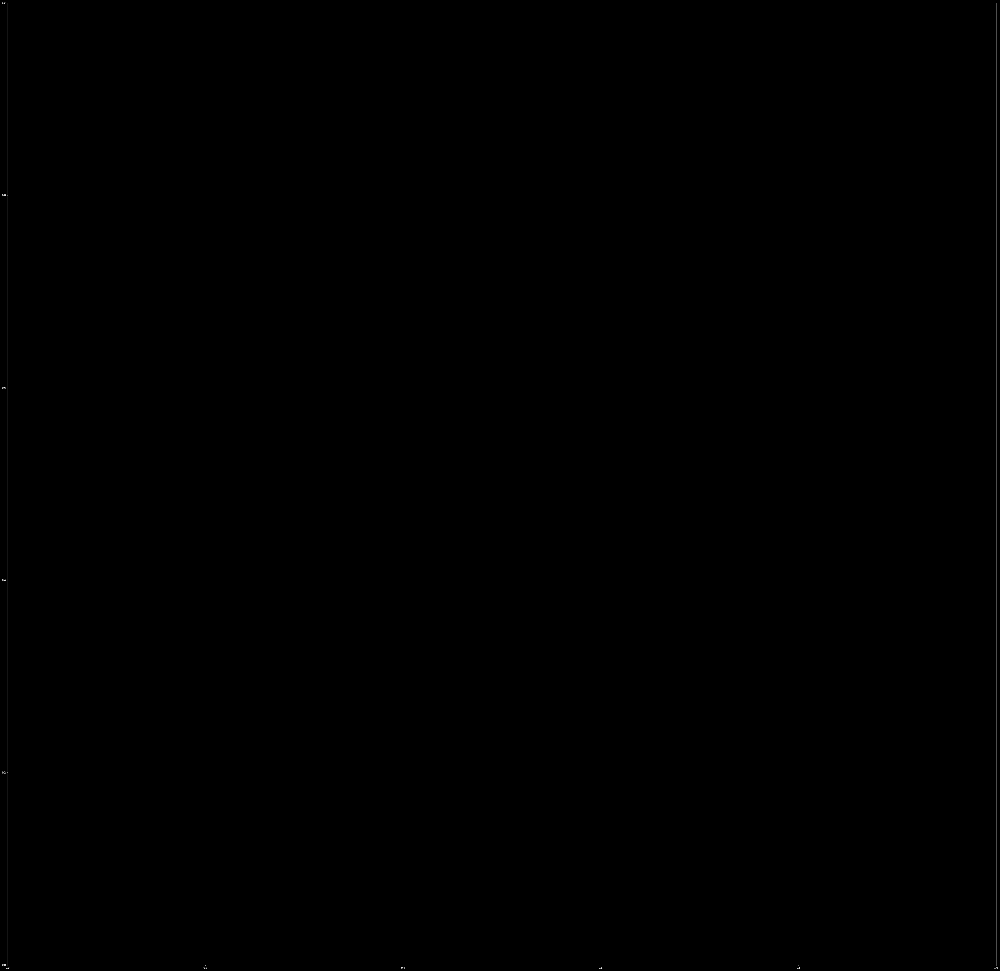

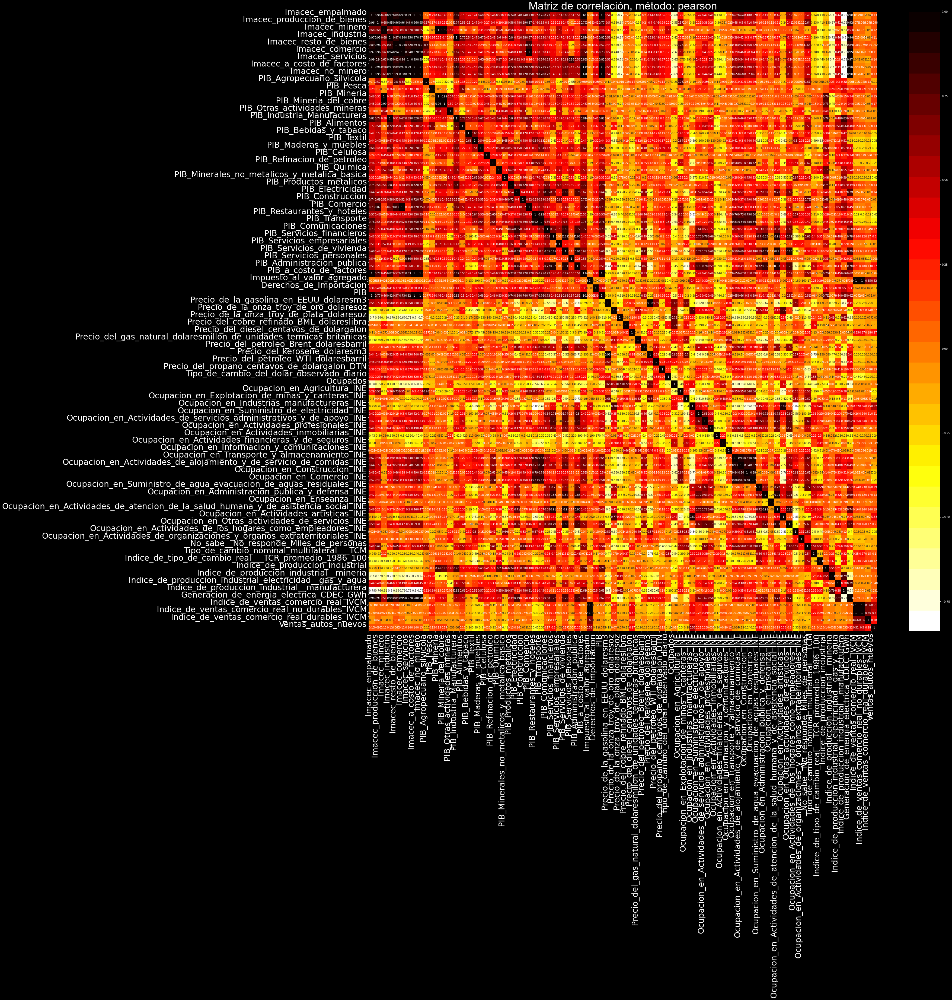

In [67]:
correlation_matrix(df, method="pearson")

In [68]:
df = df_pr.copy()
df.drop(columns=["date"], inplace=True)
method = "pearson"

Text(0.5, 1.0, 'Matriz de correlación, método: pearson')

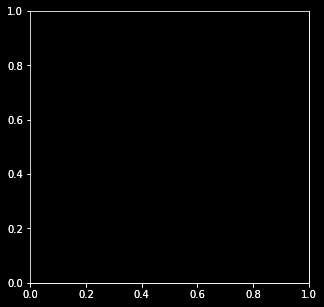

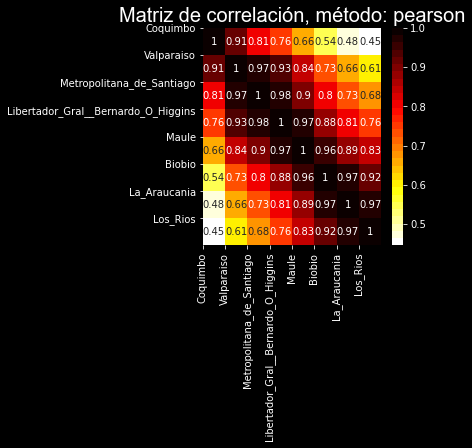

In [69]:
letter_size = 10
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
cmap = cm.get_cmap('hot_r', 30)
ax = fig.add_subplot(111)
size = int(len(list(df.columns))/2)
corr = df.corr(method=method)
fig, ax = plt.subplots(figsize=(size, size))
# ax.matshow(corr, cmap=cmap)
sns.heatmap(corr, annot=True, cmap=cmap)
plt.xticks(range(len(corr.columns)), corr.columns, fontsize=letter_size)
plt.yticks(range(len(corr.columns)), corr.columns, fontsize=letter_size)
ax.set_xticklabels(df.columns, fontsize=letter_size)
ax.set_yticklabels(df.columns, fontsize=letter_size)
plt.xticks(rotation=90)
# plt.yticks(rotation=90)
ax.set_title(f"Matriz de correlación, método: {method}",
             fontname="Arial", fontsize=letter_size+10)

### 4.2 Para el entrenamiento del modelo, queremos predecir el precio de la leche para el productor en Chile. Para eso, descarga el archivo precio_leche.csv y haz un merge con las bases de datos de precipitaciones y datos del Banco Central.

*Este archivo tiene una columna de año, mes y precio_leche (que corresponde al
precio nominal, sin IVA, en pesos chilenos por litro), por lo que vas a tener que crear
la columna de fecha que calce con la de las otras bases.

In [70]:
path_milk = "data/raw/precio_leche.csv"
df_milk = pd.read_csv(path_milk)

In [71]:
df_milk.rename(columns={"Anio": "year",
                        "Mes": "month",
                        "Precio_leche": "precio_leche"},
               inplace=True)

In [72]:
df_milk.head(10)

,year,month,precio_leche
0,1979,Ene,3.85
1,1979,Feb,4.58
2,1979,Mar,5.18
3,1979,Abr,6.06
4,1979,May,7.25
5,1979,Jun,7.71
6,1979,Jul,8.10
7,1979,Ago,7.65
8,1979,Sep,6.96
9,1979,Oct,5.79


In [73]:
df_milk["month"].unique()

array(['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep',
       'Oct', 'Nov', 'Dic'], dtype=object)

In [74]:
dict_ = {'Ene': 1, 'Feb': 2, 'Mar': 3, 'Abr': 4,
         'May': 5, 'Jun': 6, 'Jul': 7, 'Ago': 8,
         'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dic': 12}

In [75]:
df_milk['date'] = df_milk.apply(
    lambda x: '01-' + str(dict_[x['month']]) + '-' + str(x['year']), axis=1)

In [76]:
df_milk['date'] = df_milk['date'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y'))

In [77]:
# No hay duplicados en el precio de la leche
df_milk['date'].describe()

count                     506
unique                    506
top       1979-01-01 00:00:00
freq                        1
first     1979-01-01 00:00:00
last      2021-02-01 00:00:00
Name: date, dtype: object

In [78]:
print('Mínima fecha leche', df_milk['date'].min())
print('Máxima fecha leche', df_milk['date'].max())

Mínima fecha leche 1979-01-01 00:00:00
Máxima fecha leche 2021-02-01 00:00:00


In [79]:
df_bank.rename(columns={'Periodo':'date'}, inplace=True)


In [80]:
# juntar los features
db = df_pr.merge(df_bank, how='outer',on=['date'])
# juntar los targets
db = db.merge(df_milk, how='outer', on=['date'])

In [81]:
print(db.shape)
db.head(20)

(614, 97)


,date,Coquimbo,Valparaiso,Metropolitana_de_Santiago,Libertador_Gral__Bernardo_O_Higgins,Maule,Biobio,La_Araucania,Los_Rios,Imacec_empalmado,...,Indice_de_produccion_industrial__manufacturera,Generacion_de_energia_electrica_CDEC_GWh,Indice_de_ventas_comercio_real_IVCM,Indice_de_ventas_comercio_real_no_durables_IVCM,Indice_de_ventas_comercio_real_durables_IVCM,Ventas_autos_nuevos,string_fechas,year,month,precio_leche
0,1979-01-01,2.641948,0.587062,2.447114,1.608992,3.736215,17.859634,25.212940,45.596447,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1-1979,1979.0,Ene,3.85
1,1979-02-01,1.179804,2.432192,3.997852,4.346310,16.347637,17.680612,18.085072,34.075039,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2-1979,1979.0,Feb,4.58
2,1979-03-01,0.255490,0.020601,0.000000,0.055488,0.545324,14.435698,28.696504,66.232248,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3-1979,1979.0,Mar,5.18
3,1979-04-01,10.173699,11.745779,13.722349,12.989194,21.880607,39.136483,43.617921,73.548127,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,4-1979,1979.0,Abr,6.06
4,1979-05-01,1.039098,18.609286,50.187148,104.451550,143.914334,219.729235,279.409718,438.005116,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5-1979,1979.0,May,7.25
5,1979-06-01,0.141157,0.000000,1.397164,7.378558,28.797945,72.501902,113.488705,179.949832,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,6-1979,1979.0,Jun,7.71
6,1979-07-01,34.630791,118.340422,170.614262,301.256558,482.199009,411.270877,356.070480,424.988334,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7-1979,1979.0,Jul,8.10
7,1979-08-01,9.073373,49.270309,130.503624,200.210387,294.567554,378.102706,458.753077,645.763592,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,8-1979,1979.0,Ago,7.65
8,1979-09-01,12.041765,33.970292,77.705101,156.477457,161.299858,158.965598,203.191759,252.733618,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9-1979,1979.0,Sep,6.96
9,1979-10-01,0.018634,0.558101,10.871275,14.557008,11.238902,51.010499,121.420487,177.008294,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,10-1979,1979.0,Oct,5.79


<AxesSubplot:>

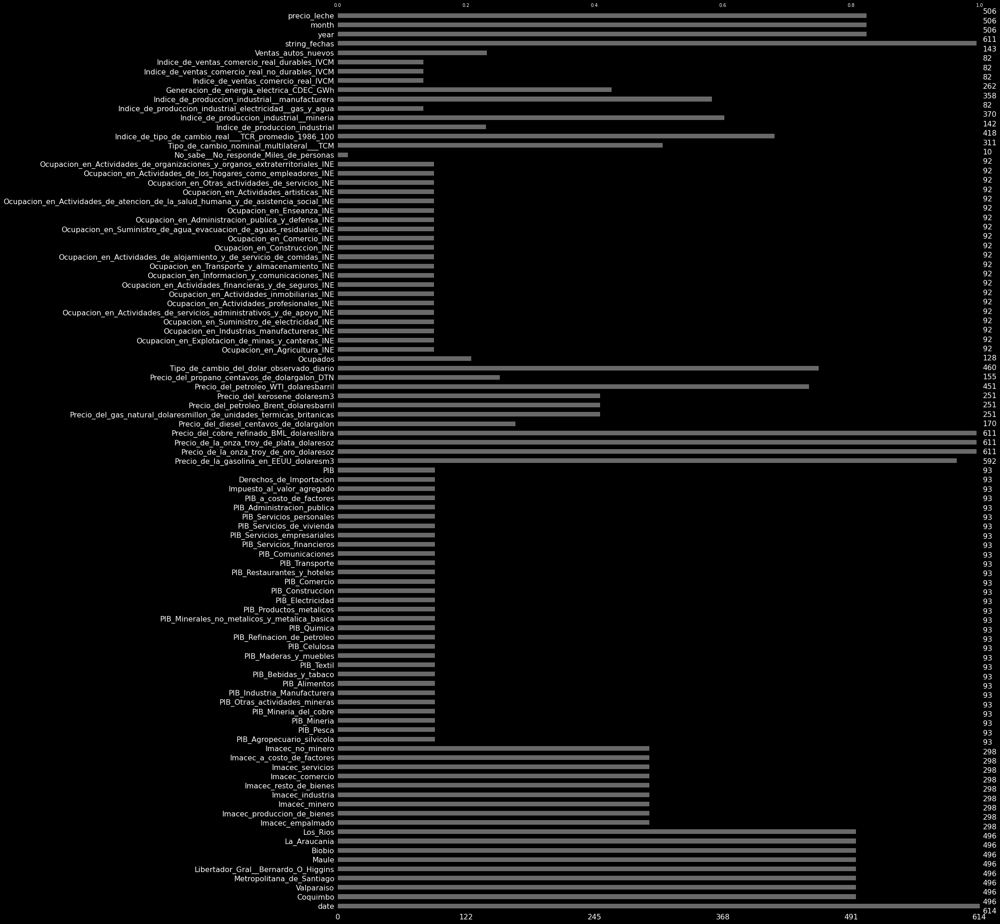

In [82]:
msno.bar(db)

<AxesSubplot:>

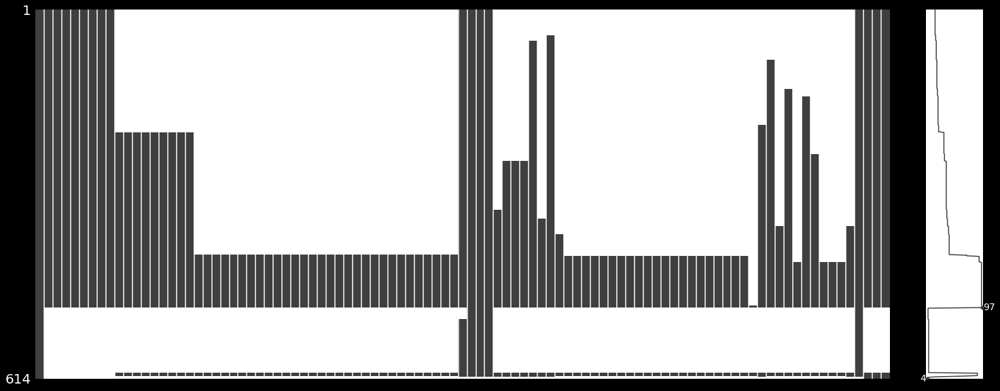

In [83]:
msno.matrix(db)

### 4.3 Crea las variables:
o A partir de la variable fecha, crea nuevas variables para el año, mes, trimestre.

o Lags y estadísticas acumuladas (por ejemplo: promedio, varianza) de las
variables que consideres relevantes.

### 4.3.1 Fetures relacionados al tiempo

In [84]:
db['year'] = db['date'].apply(lambda x: x.year)
db['month'] = db['date'].apply(lambda x: x.month)
db['trimestre'] = db['date'].apply(lambda x: int(x.month / 4) +1)

### 4.3.1 Lag features y estadísticas acumuladas

In [85]:
cols = list(db.columns)
cols.remove("date")
cols.remove("string_fechas")

**Función para agregar lag features en una lista de columnas**

In [86]:
def add_lagged_variables(df, columns, nr_of_lags=1):
    """
    Agregar variables pasadas del dataframe con el que se esta trabajando

    Parameters
    ----------
    df_input : pandas.dataframe
        Dataframe a operar.
    nr_of_lags : int
        Número de steps que quirees ir hacia atrás.
    columns : list
        Lista de columas a las cuales agregar variables lagged.

    Returns
    -------
    df : pandas.dataframe
        Dataframe con las variables lag agregadas.
    """

    for col in columns:
        lagged_column = col + f'_lagged_{str(nr_of_lags)}'
        df[lagged_column] = df[col].shift(nr_of_lags)
    return df

In [87]:
# lag de 1 mes hacía atrás
db = add_lagged_variables(db, cols, nr_of_lags=1)
# lag de un trimestre hacía atrás
db = add_lagged_variables(db, cols, nr_of_lags=4)
# lag de 1 año
db = add_lagged_variables(db, cols, nr_of_lags=12)
# lag de dos años
db = add_lagged_variables(db, cols, nr_of_lags=24)

In [88]:
print("Las dimensiones van creciendo mariooo: ", db.shape)

Las dimensiones van creciendo mariooo:  (614, 482)


In [89]:
def cumulative_simple_stats(df, cols, window=3):
    """
    En una ventana temporal de tamaño window, se hace el cálculo de las medias
    mobiles en el tiempo y desviaciones estandar mobiles, solo para tener en
    cuenta el tamaño de la ventana debe ser mayor a 2

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe a tratar.
    cols : list
        Lista de las columnas en las cuales aplicar stats.
    window : int, optional
        Tamaño de la ventana temporal. The default is 3.

    Returns
    -------
    df : pandas.dataframe
        Dataframe con las stats calculadas.

    """
    df.sort_values(by=['date'], inplace=True)
    # como se ven estacionalidades, nos centraremos en stats cercanas, al mes
    # que estamos analizando
    for columna in cols:
        # promedio 3 meses
        name1 = columna + f'_mean_{str(window)}'
        df[name1] = df[columna].rolling(window=window).mean()
        # desviacion standar ultimo año
        name2 = columna + f'_std_{str(window)}'
        df[name2] = df[columna].rolling(window=window).std()
    df.reset_index(drop=True, inplace=True)
    return df

In [90]:
# estadisticas acumuladas de 3 meses
db = cumulative_simple_stats(db, cols, window=3)
# estadisticas acumuladas de 6 meses
db = cumulative_simple_stats(db, cols, window=3)
# estadisticas acumuladas de 12 meses
db = cumulative_simple_stats(db, cols, window=12)

In [91]:
list(db.columns)

['date',
 'Coquimbo',
 'Valparaiso',
 'Metropolitana_de_Santiago',
 'Libertador_Gral__Bernardo_O_Higgins',
 'Maule',
 'Biobio',
 'La_Araucania',
 'Los_Rios',
 'Imacec_empalmado',
 'Imacec_produccion_de_bienes',
 'Imacec_minero',
 'Imacec_industria',
 'Imacec_resto_de_bienes',
 'Imacec_comercio',
 'Imacec_servicios',
 'Imacec_a_costo_de_factores',
 'Imacec_no_minero',
 'PIB_Agropecuario_silvicola',
 'PIB_Pesca',
 'PIB_Mineria',
 'PIB_Mineria_del_cobre',
 'PIB_Otras_actividades_mineras',
 'PIB_Industria_Manufacturera',
 'PIB_Alimentos',
 'PIB_Bebidas_y_tabaco',
 'PIB_Textil',
 'PIB_Maderas_y_muebles',
 'PIB_Celulosa',
 'PIB_Refinacion_de_petroleo',
 'PIB_Quimica',
 'PIB_Minerales_no_metalicos_y_metalica_basica',
 'PIB_Productos_metalicos',
 'PIB_Electricidad',
 'PIB_Construccion',
 'PIB_Comercio',
 'PIB_Restaurantes_y_hoteles',
 'PIB_Transporte',
 'PIB_Comunicaciones',
 'PIB_Servicios_financieros',
 'PIB_Servicios_empresariales',
 'PIB_Servicios_de_vivienda',
 'PIB_Servicios_personales',

In [92]:
def cumulative_distribution_stats(df, cols, window=12):
    """
    En una ventana temporal de tamaño window, se hace el cálculo de stats
    acumulativas como la como promedio y stad

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe a tratar.
    cols : list
        Lista de las columnas en las cuales aplicar stats.
    window : int, optional
        Tamaño de la ventana temporal. The default is 3.

    Returns
    -------
    df : pandas.dataframe
        Dataframe con las stats calculadas.

    """
    df.sort_values(by=['date'], inplace=True)
    # como se ven estacionalidades, nos centraremos en stats cercanas, al mes
    # que estamos analizando
    for columna in cols:
        # promedio 3 meses
        name1 = columna + f'_kurt_{str(window)}'
        df[name1] = df[columna].rolling(window=window).kurt()
        # desviacion standar ultimo año
        name2 = columna + f'_skew_{str(window)}'
        df[name2] = df[columna].rolling(window=window).skew()
    df.reset_index(drop=True, inplace=True)
    return df


def log_features(df, columns):
    """
    Agregar logaritmo de las variables

    Parameters
    ----------
    df : pandas.dataframe
        Dataframe a operar.
    columns : list
        lista de columas a las cuales agregar variables aplicar log.

    Returns
    -------
    df : df
        Dataframe con las variables agregadas con logaritmo.

    """
    for col in columns:
        log_column = 'log_' + col
        df[log_column] = df[col].apply(lambda x: np.log(x) + 1)
    return df

db.sort_values(by=["date"], inplace=True, ascending=True)
db.reset_index(drop=True, inplace=True)

In [93]:
# # estadisticas acumuladas de 12 mes
db = cumulative_distribution_stats(db, cols, window=12)
# estadisticas acumuladas de 24 mes
db = cumulative_distribution_stats(db, cols, window=24)

In [94]:
# features logaritmicos
db = log_features(db, cols)

In [95]:
print("Las dimensiones van creciendo mariooo: ", db.shape)

Las dimensiones van creciendo mariooo:  (614, 1346)


In [96]:
path_modeling = "data/modeling/data.pkl"
db.to_pickle(path_modeling)

# 5 Modelo

### 5.1 Entrena un modelo que permita predecir el precio de la leche el próximo mes, en función de los datos entregados.

### 5.2 Construye una base de test (o de cross validation). ¿Cuál fue tu definición detiempo/cantidad de datos para este set de datos? Explica por qué la elegiste así.

Estas preguntas las responderé de manera simultanea, ya que son complementarias


o Si necesitas crear variables adicionales que pueden aportar información al
modelo, tienes total libertad.


Se han creado más de 1000 features adicionales (me pase po) al dateset que contienen información variada acerca de las distintas columnas, entonces, para tratar con esta alta dimensionalidad haré dos caminos (si es que alcanzo, escribo esto domingo 01 agosto 9:50 PM xd), un modelo simple que contenga las columnas que yo considere relevantes por relación con el negocio de la leche (feature selection) y otro camino a través del la reducción de dimensinalidad, que por como veo el problema puede ser una técnica de reducción de dimensionalidad lineal, como PCA, pero hay que trabajar con solo series de tiempo estacionarias, lo cual hay que verificar. Además agregando más dificultad hay una decisión que tomar respecto a los valores faltantes, la primera y por tiempo, obviar esto y usar dropna, trabajar solo con las columnas que tengo la información completa. Y la otra es no obviar esto y ayudarme del algún algoritmo de missing imputing para imputar valores faltantes, ya que como vimos durante el desafío, existen periodos de larga ausencia de datos, por lo que usar las clasicas técnicas de imputación en series de tiempo como interpolaciones, bbfill, ffill son muy simples para este problema. Entonces tenemos el siguiente arbol.


Así que hay 4 cosas que espero alcanzar a probar, si no queda la idea para generaciones futuras xd.


```
│   ├─── Feature selecction (bien manual y un poquito más pro a través de correlación)
│   ├───  ├─── Hacerlo simple .dropna() y vamos a la etapa de selección de modelos
│   └─── Dimensionality reduction (over time series)
│   ├───  ├─── Hacerlo simple .dropna() y vamos a la etapa de selección de modelos
│   ├───  ├─── Imputar valores faltantes con imputers (kNN Imputer u otros) e ir a la etapa de                      selección de modelo
```

Ojo que lo que se requiere es un modelo que en función de los datos entregados, es decir con los features del tiempo t, sea capaz de predecir el precio de la leche en el tiempo t+1 (forecast, o eso es lo que entendí al menos), por lo tanto se debe generar esta columna target que debe ser un shift -1 de la columna precio_leche.


In [97]:
# solo verificar estacionaridad en la columna precio_leche, a la hora de escoger modelos
df = db.copy()
df.dropna(subset=['precio_leche'], inplace=True)
cols = ["precio_leche"]

stationarity_test = stationary_adf_test(df, cols)

Para la columna:  precio_leche
No se rechaza la hipótesis nula (H0), los datos no son estacionarios
ADF estadisticas: 1.065408
Valor de p: 0.994910
Valores criticos:
	1%: -3.444
	5%: -2.867
	10%: -2.570


La columna precio_leche no es estacionaria en el tiempo, por lo que una buena idea sería diferenciarla con algún modelo ARIMA

### 5.1.1 Feature selection, Normalization, Cross Validation Datasets

En esta sección hago una selección manual de features, los que desde mi punto de vista, pueden están relacionados al negocio de la carne (data de las regiones productoras de leche Araucanía, temporalidad del año, tasas de ocupación en la agricultura y PIB asociados a la industría.

Posterior a eso, se define el target del problema, que en este caso es el precio de la leche en el mes siguiente (forecast),

Normalización de los datos dentro del rango de 0-1.

Cross validation: Este problema es un problema de forecast, por lo que no se puede hacer cross validation randomizando los datos, hay que hacer un TimeSeries Split, para ello usaré 5  Folds, debido a que la cantidad de datos no es gran cosa (pero trabajo honesto)

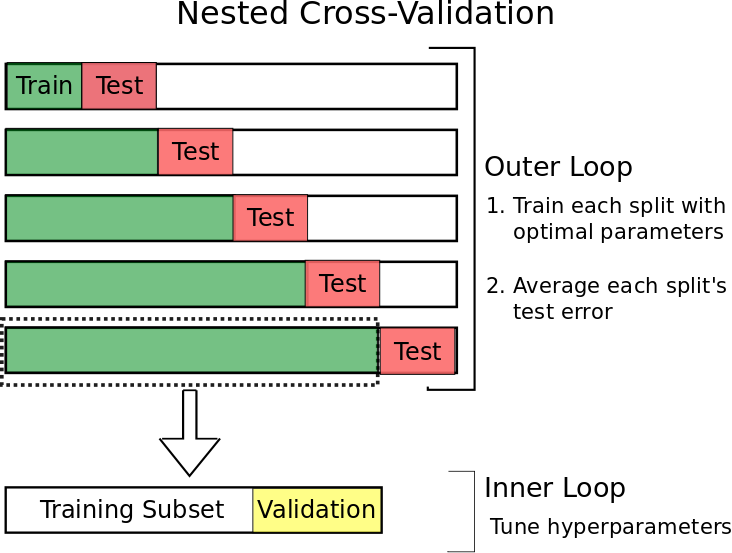



In [99]:
model_features = ['date', 'precio_leche', 'year', 'month', 'trimestre',
                  'La_Araucania', 'PIB', 'PIB_Agropecuario_silvicola',
                  'PIB_Alimentos', 'Ocupacion_en_Agricultura_INE',
                  'La_Araucania_lagged_1', 'La_Araucania_lagged_12',
                  'precio_leche_lagged_1', 'precio_leche_lagged_12',
                  'PIB_Alimentos_lagged_12', 'PIB_lagged_12',
                  'Ocupacion_en_Agricultura_INE_lagged_1',
                  'La_Araucania_mean_3', 'La_Araucania_mean_12',
                  'La_Araucania_std_12', 'Los_Rios_mean_3']

In [175]:
# OJO CAMBIO DE db -- > df para no perder la base de datos por si me equivoco en algo
df = db[model_features]

**Shift en la columna para convertirlo en problema de forecast, asociando a la columna target, el precio de la leche en el mes siguiente al actual**

In [176]:
# Shit a la columan de predicción
df["target"] = df["precio_leche"].shift(-1)
df.sort_values(by=["date"], ascending=True, inplace=True)

In [177]:
# ordenar las columnas para hacerlas visibles
order = list(df.columns)
order.remove("date")
order.remove("target")
order.remove("precio_leche")
df = df[["date", "precio_leche", "target"] + order]

In [178]:
df.describe()

,precio_leche,target,year,month,trimestre,La_Araucania,PIB,PIB_Agropecuario_silvicola,PIB_Alimentos,Ocupacion_en_Agricultura_INE,...,La_Araucania_lagged_12,precio_leche_lagged_1,precio_leche_lagged_12,PIB_Alimentos_lagged_12,PIB_lagged_12,Ocupacion_en_Agricultura_INE_lagged_1,La_Araucania_mean_3,La_Araucania_mean_12,La_Araucania_std_12,Los_Rios_mean_3
count,506.000000,506.000000,614.000000,614.000000,614.000000,496.000000,93.000000,93.000000,93.000000,92.000000,...,496.000000,505.000000,496.000000,88.000000,88.000000,92.000000,494.000000,485.000000,485.000000,494.000000
mean,114.444980,114.444980,1995.084691,6.483713,2.245928,151.486456,121.578349,354.525985,343.754614,671.860910,...,151.486456,114.086970,110.766633,343.236804,122.006064,671.860910,151.934816,152.691090,126.117022,199.936032
std,78.999882,78.999882,14.782137,3.461119,0.926204,126.628503,7.631217,174.173859,27.300876,73.370436,...,126.628503,78.666264,75.341167,27.833697,7.591978,73.370436,97.588049,25.207958,29.461664,107.723822
min,3.850000,3.850000,1970.000000,1.000000,1.000000,0.005331,104.022977,149.713225,269.037610,420.865087,...,0.005331,3.850000,3.850000,269.037610,104.022977,420.865087,3.841472,78.286573,56.159382,26.234031
25%,48.162500,48.162500,1982.000000,3.000000,1.000000,52.930343,116.388398,209.516440,325.455936,635.903299,...,52.930343,48.130000,47.592500,324.493308,116.720915,635.903299,69.850135,136.476409,103.949639,109.728345
50%,102.250000,102.250000,1995.000000,6.000000,2.000000,110.570990,121.503597,290.786889,340.178603,667.879627,...,110.570990,102.230000,101.535000,338.502994,121.745165,667.879627,127.900674,153.995568,125.996946,179.370538
75%,189.175000,189.175000,2008.000000,9.000000,3.000000,208.316243,126.718108,533.636580,364.609268,727.798978,...,208.316243,189.070000,186.747500,364.826025,127.248115,727.798978,218.904269,168.882850,153.456739,281.972012
max,318.880000,318.880000,2021.000000,12.000000,4.000000,661.211203,140.573677,704.614473,398.773275,798.092771,...,661.211203,318.880000,316.250000,398.773275,140.573677,798.092771,430.728441,242.324836,179.981736,480.198015


In [179]:
# sacar los features disponibles
features = list(df.columns)
features.remove("date")
features.remove("target")

df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

In [180]:
# problema de aprendizaje supervisado
x = df[features]
y = df[["target"]]

# pasar df a numpy.array
x = x.to_numpy()
y = y.to_numpy()

In [181]:
print(x.shape, y.shape)

(76, 20) (76, 1)


In [182]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
# normalizar los features
# Normalizar datos X
sc = MinMaxScaler()
# training
x = sc.fit_transform(x)
# time series kFold
tscv = TimeSeriesSplit(n_splits=5)

In [183]:
x.shape

(76, 20)

### 5.1.2 Baseline + Cross Validation

Siempre es bueno partir con un baseline, con el cual se pueda ir mejorando a través del test de múltiples modelos, el modelo baseline usado en la gran mayoria de los casos es 


In [184]:
results = []
iteration = 1
for train_index, test_index in tscv.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]
    lr = LinearRegression().fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    mae = mean_absolute_error(y_pred, y_test)
    mse = mean_squared_error(y_pred, y_test)
    rmse = np.sqrt(mean_squared_error(y_pred, y_test))
    std = np.abs(y_pred-y_test).std()
    mape = (np.abs(y_pred-y_test) / y_test).mean() * 100
    results.append([iteration, mae, mse, rmse, mape, std])
    iteration += 1
# guardarlo en un df y darle un nombre
results = pd.DataFrame(results, columns=["iteracion", "MAE", "MSE", "RMSE", "MAPE","VARIANCE"])
results["algoritmo"] = "regresion_lineal"

print("Mean absolute error:", results["MAE"].mean())
print("Mean squared error:", results["MSE"].mean())
print("Root mean squared error:", results["RMSE"].mean())
print("Mean Percentage error:", results["MAPE"].mean())
print("Varianza del error:", results["VARIANCE"].mean())

# guardar el resultado para generaciones futuras
lr_df = results.copy()

TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] TEST: [16 17 18 19 20 21 22 23 24 25 26 27]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27] TEST: [28 29 30 31 32 33 34 35 36 37 38 39]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] TEST: [40 41 42 43 44 45 46 47 48 49 50 51]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51] TEST: [52 53 54 55 56 57 58 59 60 61 62 63]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63] TEST: [64 65 66 67 68 69 70 71 72 73 74 75]
Mean absolute error: 8.757141604245719
Mean squared error: 122.63452800845194
Root mean squared error: 10.387908624890347
Mean Pe

Una buena técnica dado que no hemos realizado mucho feature selection, es agregar algún tipo de regularización, para este caso lo mejor que podemos hacer es usar alguna regularización de tipo L1, en este caso la regresión utilizada sería un Lasso

In [185]:
from sklearn.linear_model import Lasso

In [192]:
results = []
iteration = 1
for train_index, test_index in tscv.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    x_train, x_test = x[train_index], x[test_index]
    y_train, y_test = y[train_index], y[test_index]
    lr = Lasso(alpha=0.001).fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    mae = mean_absolute_error(y_pred, y_test)
    mse = mean_squared_error(y_pred, y_test)
    rmse = np.sqrt(mean_squared_error(y_pred, y_test))
    std = np.abs(y_pred-y_test).std()
    mape = (np.abs(y_pred-y_test) / y_test).mean() * 100
    results.append([iteration, mae, mse, rmse, mape, std])
    iteration += 1
# guardarlo en un df y darle un nombre
results = pd.DataFrame(results, columns=["iteracion", "MAE", "MSE", "RMSE", "MAPE","VARIANCE"])
results["algoritmo"] = "regresion_lineal"

print("Mean absolute error:", results["MAE"].mean())
print("Mean squared error:", results["MSE"].mean())
print("Root mean squared error:", results["RMSE"].mean())
print("Mean Percentage error:", results["MAPE"].mean())
print("Varianza del error:", results["VARIANCE"].mean())

# guardar el resultado para generaciones futuras
lasso_df = results.copy()

TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] TEST: [16 17 18 19 20 21 22 23 24 25 26 27]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27] TEST: [28 29 30 31 32 33 34 35 36 37 38 39]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] TEST: [40 41 42 43 44 45 46 47 48 49 50 51]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51] TEST: [52 53 54 55 56 57 58 59 60 61 62 63]
TRAIN: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63] TEST: [64 65 66 67 68 69 70 71 72 73 74 75]
Mean absolute error: 7.994921193011692
Mean squared error: 102.8915893615645
Root mean squared error: 9.317487814094545
Mean Perc

**La regularización logra bajar un poco el error RMSE agregando regularización L1!**, sin embargo la varianza del erro sigue siendo elevada

Voy a resolver todas las preguntas primero y si me alcanza el tiempo haré todo lo prometido ajaj! 

### 5.3 ¿Qué datos adicionales te gustaría tener?¿Qué datos son necesarios para que este modelo funcione/mejore las métricas?

Este es un problema relacioanado a la producción de leche, sin embargo no tenemos muchas features relacionadas a la producción de leche, teniendo en cuenta que el precio de la leche, esta asociado directamente con la producción de leche me gustaría tener información acerca de los siguientes puntos:
 
- Mano de obra: La mano de obra disponible en las regiones reflejadas a través de tasas de ocupación, mano de obra asociada a la industria por región, etc.

- Rebaño: Dado que estos son los encargados de producir la leche, todo tipo de estadistica asociada a ellos sería relevante, cantidad de bovinos por zona, peso de los bovinos, cantidad de toros, vacas, etc.
 
- Tecnología: Sensorización asociada a la producción de leche, calidad del agua, etc.

- Tierra: Determina las condiciones a las que se va a enfrentan el bovino. Por tanto cualquier feature relacionado al tipo de tierra con el que se esta trabajando

- Fertilizantes: Precio de fertilizantes y cantidad de fertilizantes usados (urea, superfostato, potacio, algunos de los que encontré)

- Otros como: Precio del trigo, tasas de interes bancarios a los productores de leche, precio de la carne, exportación de quesos, ect..


Variables que muestren correlación al precio de la leche o la producción de la misma.


### 5.4 ¿Cómo evalúas el resultado del modelo?¿Qué métricas tiene sentido mirar?

Al momento de evaluar los resultados del modelo se utiliza el mire varias metricas, como el MAE (mean absolute error), MSE(Mean squared error), RMSE (root mean squared error) y varianza del error. A la hora de evaluar el rmse es que mejor considera la varianza del error, dado que penaliza errores más grandes. Los resultados se evaluan a través de TimeSeries Cross validation para tenere en cuenta el error por sobre todas las particiones de los datos, únicamente en el conjunto de Test (validación cruzado sobre el conjunto de test).

Elegí trabajar con una regresión lineal, dado la cantidad de observaciones que quedaron disponibles en el dataset, entonces haber utilizado algo no lineal habría que considerar de manera super estricta el posible sobre ajuste en los datos.

Los errores logrados por este modelo baseline, fueron de:

- Mean absolute error: 7.994921193011692
- Mean squared error: 102.8915893615645
- Root mean squared error: 9.317487814094545
- Mean Percentage error: 6.836719401653182
- std error: 12.341286846740994


Un MAPE del orden del 6 % en el modelo con regularización y 3 % en el modelo sin regularización, sin embargo se escoge el modelo sin el termino L1 de regularización, dado que este hace aumentar la varianza del error (TRADE OF BIAS AND VARIANCE) -- > 3 % De MAPE


### 5.5 ¿Para qué aplicaciones puede servir un modelo de este tipo? En particular, ¿Cómo podría ayudar a combatir el cambio climático?

Voy responder al precio de la leche primero, después generalizaré a modelos de forecasting en general y como estos nos pueden traer un beneficio como sociedad.

Es sabido que la industria ganadera es una de las que más contamina por gases invernadero en el mundo, siendo una de las industrias más contaminantes.

**https://www.terram.cl/2019/09/cambio-climatico-y-la-industria-de-la-carne-expertos-actores-y-autoridades-abordan-la-sustentabilidad-del-sistema-ganadero/** 


Dicho esto, un modelo que nos permita conocer de manera anticipada el precio de la lecha, nos permitiria anticipar la falta de los insumos que son necesarios en la producción de leche, ejemplo:
Aumento del precio de la leche --> Baja oferta de leche --> baja producción de leche --> Factores mediambientales que puedan afectar el consumo de leche (sequias, indices de vegetación, afectación en flora, fauna, traslape de estaciones del año, etc.). Este modelo nos permitiría tomar decisiones anticipadas de acuerdo a la evolución del precio de la leche, además de poder realizar simulaciones sobre este modelo. 


Ahora respondiendo en como un modelo de forecasting nos ayudaría a combatir el cambio climatico. Creo que más allá de los beneficios evidentes como:

- Identificar la estrategia más exitosa a aplicar según lo previsto en el tiempo.
- Tener información relevante con la cual realizar mejores planificaciones de politicas publicas.
- Tener un calendario claro de eventos o posibles eventos para desarrollar proyectos en base a ello.

Creo que los modelos de forecasting son un paso clave en una solución que ya varias empresas han empezado, pero todas vendiendo humo.

Digital Twin de la tierra [Alerta prometo no decir la palabra DT para que no me digan vende humo!]. 

Imaginen una politica publica mundial, que obligara a todas las industrias (minería, ganado, electronica, manufacturera, etc) a medir y **regular sus emisiones** (tal y como lo hacen actualmente las industrias electricas a carbón, que solo miden, pero no regulan un carajo sus emisiones), y que junto con ello disponibilizaran sus datos de manera publica. Este es el primer paso para visualizar y cuantificar sus emisiones.

Ahora con es información disponible y más como relacionada a la población de habitantes, número de vehiculos, consumo energetico, porcentaje de renovables, etc.., hacer un forecaster gloablde emisiones como punto inicial de un modelo, podríamos construir un primer modelo que describa la función de transferenia industrias + población -- > Gases invernaderos. Esto no solo permitiria ver la proyeccción de nuestras emisiones y elaborar politicas publicas en función de lo proyectado, si no que nos permitiría tener el primer sistema de recomendación mundial, que a través por ejemplo de aprendizaje por refuerzo, no entregué una politica de comportamiento de emisiones global, sobre las cuales las industrias debería ser reguladas en base a ello. El sistema forecaster sería ideal, porque se transformaría en el entorno de simulación de las politicas del agente. O bueno cualquier otro sistema de recomendación puede ser creado en base al forecaster (sistemas de recomendación basados en en espacios latentes, etc).

El potencial de los un sistema de forecasting ambiental es super grande, espero que las naciones más influyentes y que de verdad tiene afectación tomen conciencia de eso y lo apliquen.

Me fuí un poco en vola xd !









# 6. Extras al desafío

En esta parte avanzaré lo más posible dentro lo que dí como propuestas a mejorar este forecaster